In [1]:
import sys
sys.path.append("../2_train_models")

# TODO: update this to use eval on the test set at the last second

from utils import get_proj_dir
from file_configs import ValFilesConfig, TrainFilesConfig
from data_loading import extract_peaks, extract_observed_profiles
from performance_metrics import compute_performance_metrics
from plot_utils import get_continuous_cmap

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import numpy as np
import pandas as pd
import os
import torch
from collections import defaultdict

In [2]:
cell_type = "K562"
timestamp = "2022-10-05_03-39-32"
model_type = "strand_merged_umap"
data_type = "procap"

in_window = 2114
out_window = 1000

In [3]:
def get_pseudorep_filepaths(val_config, pseudorep, pos_or_neg = "pos"):
    data_dir = os.path.dirname(val_config.train_val_peak_path)
    return os.path.join(data_dir, "pseudorep" + str(pseudorep) + "." + pos_or_neg + ".bigWig")

def get_rep_filepaths(val_config, rep, pos_or_neg = "pos"):
    data_dir = os.path.dirname(val_config.train_val_peak_path)
    return os.path.join(data_dir, "rep" + str(rep) + ".5prime." + pos_or_neg + ".bigWig")

In [4]:
def load_all_data(cell_types, timestamp, model_type, data_type):
    config = ValFilesConfig(cell_type, model_type, timestamp, data_type)
    
    true_profs = extract_observed_profiles(config.plus_bw_path,
                                           config.minus_bw_path,
                                           config.val_peak_path,
                                           out_window=config.out_window,
                                           verbose=True)

    true_counts = true_profs.sum(axis=-1).squeeze()

    r1_profs = extract_observed_profiles(get_rep_filepaths(config, 1, "pos"),
                                         get_rep_filepaths(config, 1, "neg"),
                                         config.val_peak_path,
                                         out_window=config.out_window,
                                         verbose=True)

    r2_profs = extract_observed_profiles(get_rep_filepaths(config, 2, "pos"),
                                         get_rep_filepaths(config, 2, "neg"),
                                         config.val_peak_path,
                                         out_window=config.out_window,
                                         verbose=True)

    pr1_profs = extract_observed_profiles(get_pseudorep_filepaths(config, 1, "pos"),
                                          get_pseudorep_filepaths(config, 1, "neg"),
                                          config.val_peak_path,
                                          out_window=config.out_window,
                                          verbose=True)

    pr2_profs = extract_observed_profiles(get_pseudorep_filepaths(config, 2, "pos"),
                                          get_pseudorep_filepaths(config, 2, "neg"),
                                          config.val_peak_path,
                                          out_window=config.out_window,
                                          verbose=True)

    log_pred_profs = np.load(config.pred_profiles_val_path)
    pred_logcounts = np.load(config.pred_logcounts_val_path).squeeze()
        
    return true_profs, true_counts, r1_profs, r2_profs, pr1_profs, pr2_profs, log_pred_profs, pred_logcounts


true_profs, true_counts, r1_profs, r2_profs, \
pr1_profs, pr2_profs, log_pred_profs, pred_logcounts = load_all_data(cell_type,
                                                                     timestamp,
                                                                     model_type,
                                                                     data_type)

Timestamp: 2022-10-05_03-39-32


Loading Profiles: 3834it [00:01, 2990.89it/s]

== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/models/procap/K562/strand_merged_umap/2022-10-05_03-39-32_in/peaks_uni_and_bi_val.bed.gz
Profile length: 1000
Num. Examples: 3834



Loading Profiles: 3834it [00:01, 3063.19it/s]

== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/models/procap/K562/strand_merged_umap/2022-10-05_03-39-32_in/peaks_uni_and_bi_val.bed.gz
Profile length: 1000
Num. Examples: 3834



Loading Profiles: 3834it [00:01, 3013.02it/s]

== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/models/procap/K562/strand_merged_umap/2022-10-05_03-39-32_in/peaks_uni_and_bi_val.bed.gz
Profile length: 1000
Num. Examples: 3834



Loading Profiles: 3834it [00:01, 3036.90it/s]

== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/models/procap/K562/strand_merged_umap/2022-10-05_03-39-32_in/peaks_uni_and_bi_val.bed.gz
Profile length: 1000
Num. Examples: 3834



Loading Profiles: 3834it [00:01, 3262.96it/s]

== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/models/procap/K562/strand_merged_umap/2022-10-05_03-39-32_in/peaks_uni_and_bi_val.bed.gz
Profile length: 1000
Num. Examples: 3834


In [5]:
umap_filepath = "/users/kcochran/projects/new_procap_models/annotations/hg38.k36.multiread.umap.bigWig"

def load_mappability_for_peaks(cell_type, model_type, timestamp, data_type):
    config = ValFilesConfig(cell_type, model_type, timestamp, data_type)
    print(config)
    _, _, umap_masks = extract_peaks(config.genome_path,
                                     config.chrom_sizes,
                                     config.plus_bw_path,
                                     config.minus_bw_path,
                                     config.val_peak_path,
                                     mask_bw_path=umap_filepath,
                                     in_window=config.in_window,
                                     out_window=config.out_window,
                                     max_jitter=0, verbose=True)
    return umap_masks
        
umap_masks = load_mappability_for_peaks(cell_type, model_type, timestamp, data_type)

Timestamp: 2022-10-05_03-39-32
Loading genome sequence from /mnt/lab_data2/kcochran/new_procap_models/genomes/hg38.withrDNA.fasta


Reading FASTA: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:32<00:00,  1.36s/it]
Loading Peaks: 3834it [00:10, 377.26it/s]


== In Extract Peaks ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/models/procap/K562/strand_merged_umap/2022-10-05_03-39-32_in/peaks_uni_and_bi_val.bed.gz
Sequence length (with jitter): 2114
Profile length (with jitter): 1000
Max jitter applied: 0
Num. Examples: 3834
Mask loaded? True


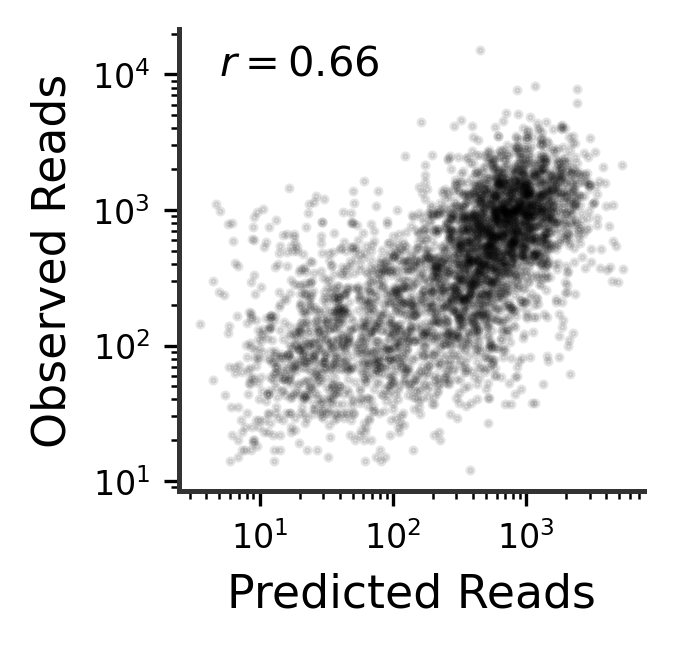

In [6]:
def plot_pred_vs_true_counts(pred_logcounts, true_counts):
    
    plt.figure(figsize=(2, 2), dpi=300)
    
    # if the model preds/data are stranded, merge the two strands
    if len(pred_logcounts.shape) > 1:
        pred_logcounts = np.sum(pred_logcounts, axis=-1)
    if len(true_counts.shape) > 1:
        true_counts = np.sum(true_counts, axis=-1)
    assert pred_logcounts.shape == true_counts.shape

    plt.scatter(np.exp(pred_logcounts), true_counts,
                alpha = 0.1, s = 2, color="k")

    plt.semilogx()
    plt.semilogy()

    plt.ylabel("Observed Reads", fontsize=11)
    plt.xlabel("Predicted Reads", fontsize=11)
    
    pearson_r = np.corrcoef(pred_logcounts,
                            np.log1p(true_counts))[0,1]
    plt.text(5, 10000, r'$r = %0.2f$' % pearson_r, fontsize=10)

    # aesthetics
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params("both", labelsize=8)
        
    plt.show()
    

plot_pred_vs_true_counts(pred_logcounts, true_counts)

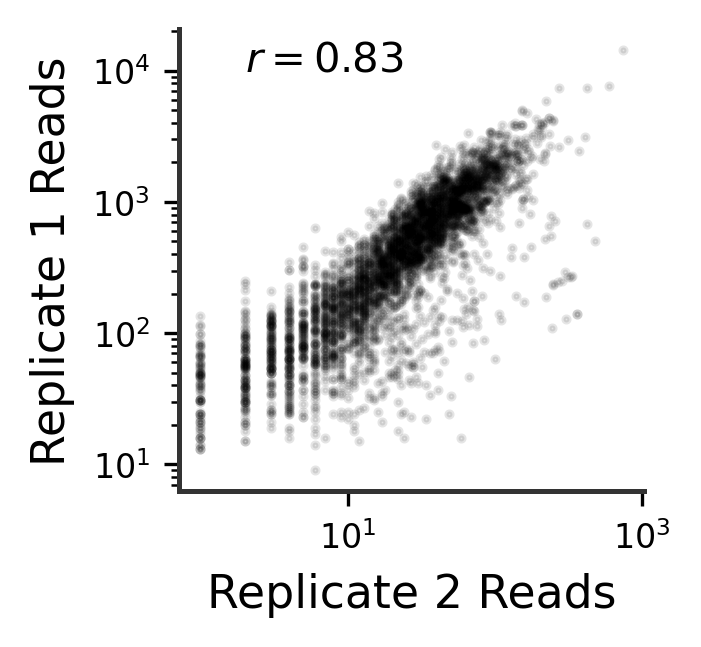

In [7]:
def plot_rep1_vs_rep2_counts(rep1_counts, rep2_counts):
    
    plt.figure(figsize=(2, 2), dpi=300)
    
    # if the model preds/data are stranded, merge the two strands
    if len(rep1_counts.shape) > 1:
        rep1_counts = np.sum(rep1_counts, axis=-1)
    if len(rep2_counts.shape) > 1:
        rep2_counts = np.sum(rep2_counts, axis=-1)
    assert rep1_counts.shape == rep2_counts.shape

    plt.scatter(rep1_counts, rep2_counts,
                alpha = 0.1, s = 2, color="k")

    plt.semilogx()
    plt.semilogy()

    plt.ylabel("Replicate 1 Reads", fontsize=11)
    plt.xlabel("Replicate 2 Reads", fontsize=11)
    
    pearson_r = np.corrcoef(np.log1p(rep1_counts),
                            np.log1p(rep2_counts))[0,1]
    plt.text(2, 10000, r'$r = %0.2f$' % pearson_r, fontsize=10)

    # aesthetics
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params("both", labelsize=8)
        
    plt.show()
    

plot_rep1_vs_rep2_counts(r1_profs.sum(axis=(-1,-2)),
                         r2_profs.sum(axis=(-1,-2)))

In [8]:
def get_replicate_val_metrics(rep1_profs, rep2_profs):
    # need to make one of the replicates look like model predictions
    # (normalize to sum to 1, then take the log)
    # (need to add pseudocount to avoid log of 0 error)
    log_rep2_profs = np.log((rep2_profs + 1e-2) / (rep2_profs + 1e-2).sum(axis=(-1,-2), keepdims=True))

    metrics = compute_performance_metrics(rep1_profs.swapaxes(1,2)[:, None, :, :],
                                          log_rep2_profs.swapaxes(1,2)[:, None, :, :],
                                          rep1_profs.sum(axis=-1)[:, None, :],
                                          np.log1p(rep2_profs.sum(axis=-1))[:, None, :],
                                          smooth_true_profs=False,
                                          smooth_pred_profs=False)
    return metrics

rep_val_metrics = get_replicate_val_metrics(pr1_profs, pr2_profs)

/mnt/lab_data2/kcochran/new_procap_models/src/figure_notebooks/../2_train_models/performance_metrics.py:52: RuntimeWarning: invalid value encountered in true_divide
  cross_ent = (-log_prob_pows_sum) / trials


In [9]:
def get_nonsmooth_val_metrics(true_profs, log_pred_profs,
                              true_counts, pred_logcounts):
        
    metrics = compute_performance_metrics(true_profs.swapaxes(1,2)[:, None, :, :],
                                          log_pred_profs.swapaxes(1,2)[:, None, :, :],
                                          true_counts[:, None, :],
                                          np.concatenate((pred_logcounts[:, None, None],
                                                          pred_logcounts[:, None, None]), axis=-1),
                                          smooth_true_profs=False,
                                          smooth_pred_profs=False)
    return metrics

val_metrics = get_nonsmooth_val_metrics(true_profs, log_pred_profs,
                                        true_counts, pred_logcounts)

In [10]:
def get_random_baseline_val_metrics(true_profs, true_counts):
    # if you run this on models that are not strand-merged, update this function
    assert "strand_merged" in model_type
    
    rand_pred_profs = np.ones_like(true_profs)
    rand_log_pred_profs = np.log(rand_pred_profs / np.sum(rand_pred_profs, axis=(-1,-2), keepdims=True))
    rand_pred_logcounts = np.ones_like(true_counts)

    metrics = compute_performance_metrics(true_profs.swapaxes(1,2)[:, None, :, :],
                                          rand_log_pred_profs.swapaxes(1,2)[:, None, :, :],
                                          true_counts[:, None, :],
                                          rand_pred_logcounts[:, None, :],
                                          smooth_true_profs=False,
                                          smooth_pred_profs=False)
    return metrics

rand_val_metrics = get_random_baseline_val_metrics(true_profs, true_counts)

In [18]:
def get_avg_baseline_val_metrics(true_profs, true_counts):
    # if you run this on models that are not strand-merged, update this function
    assert "strand_merged" in model_type
    
    config = TrainFilesConfig(cell_type, model_type, timestamp, data_type)
    train_true_profs = extract_observed_profiles(config.plus_bw_path,
                                           config.minus_bw_path,
                                           config.train_peak_path,
                                           out_window=out_window,
                                           verbose=True)
    
    avg_prof = train_true_profs.mean(axis=0)
    log_avg_prof = np.log(avg_prof / np.sum(avg_prof, axis=(-1,-2), keepdims=True))
    log_avg_prof_tiled = np.tile(log_avg_prof, (true_profs.shape[0], 1, 1))
    
    rand_pred_logcounts = np.ones_like(true_counts)

    metrics = compute_performance_metrics(true_profs.swapaxes(1,2)[:, None, :, :],
                                          log_avg_prof_tiled.swapaxes(1,2)[:, None, :, :],
                                          true_counts[:, None, :],
                                          rand_pred_logcounts[:, None, :],
                                          smooth_true_profs=False,
                                          smooth_pred_profs=False)
    return metrics


avgprof_val_metrics = get_avg_baseline_val_metrics(true_profs, true_counts)

Timestamp: 2022-10-05_03-39-32


Loading Profiles: 23166it [00:08, 2601.92it/s]


== In Extract Profiles ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/data/procap/processed/K562/peaks_uni_and_bi_train.bed.gz
Profile length: 1000
Num. Examples: 23166


/mnt/lab_data2/kcochran/new_procap_models/src/figure_notebooks/../2_train_models/performance_metrics.py:52: RuntimeWarning: invalid value encountered in true_divide
  cross_ent = (-log_prob_pows_sum) / trials


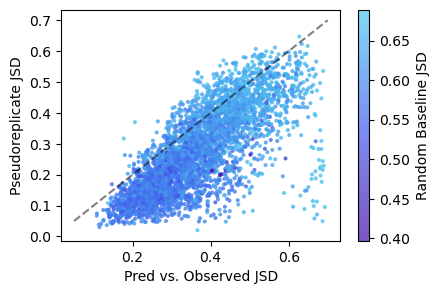

In [23]:
plt.figure(figsize=(4.5,3))
plt.scatter(val_metrics["jsd"], rep_val_metrics["jsd"], alpha=0.7, s=4,
            c = rand_val_metrics["jsd"],
            cmap = get_continuous_cmap(["#480CA8", "#4361EE", "#4CC9F0"]))

plt.plot([0.05,0.7],[0.05,0.7], color="k", alpha=0.5, linestyle="dashed")
plt.xlabel("Pred vs. Observed JSD")
plt.ylabel("Pseudoreplicate JSD")
plt.colorbar(label="Random Baseline JSD")
plt.show()

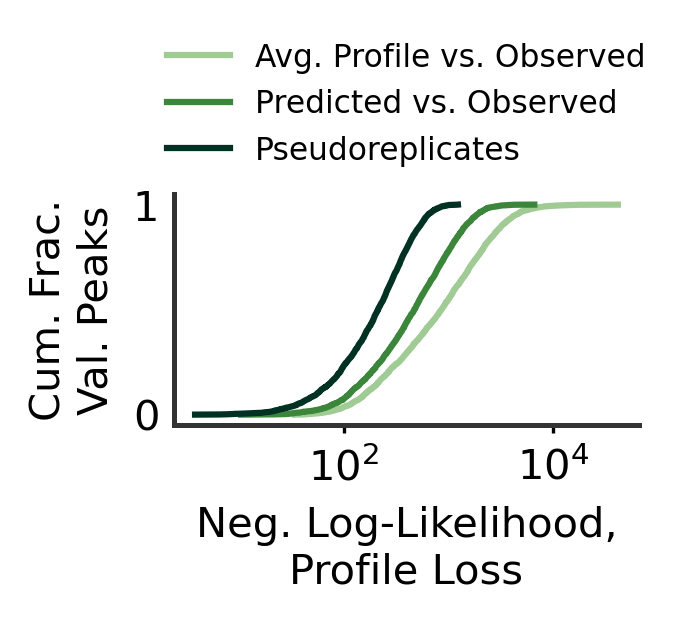

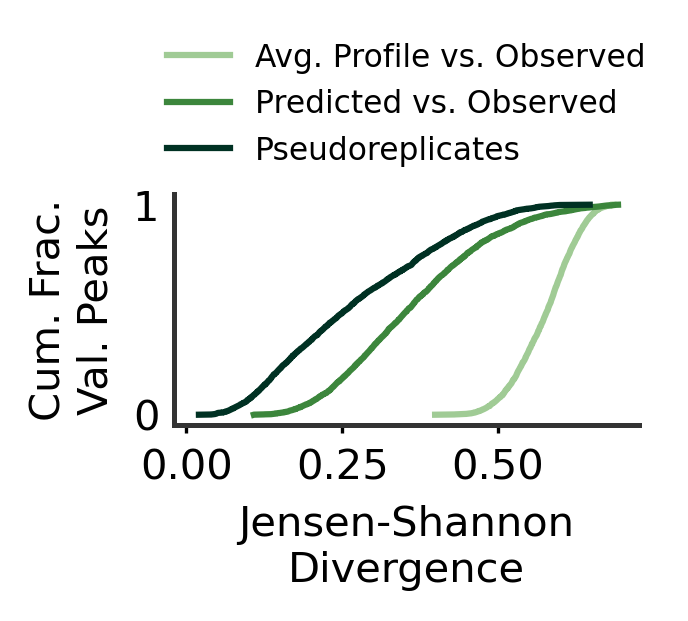

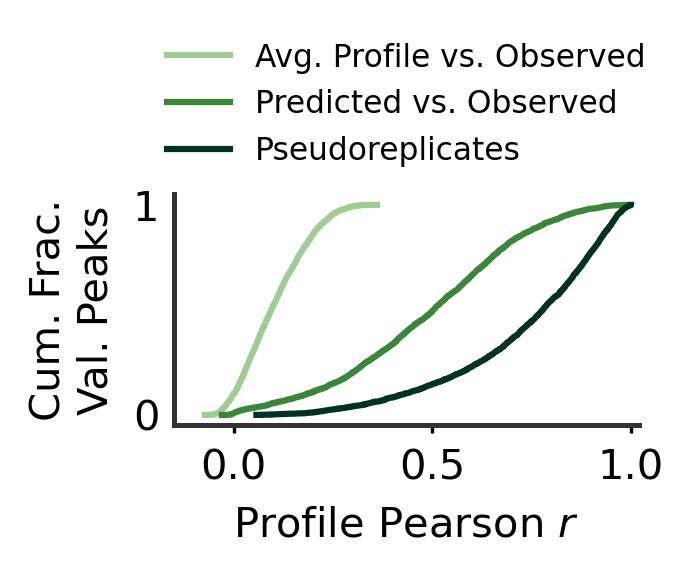

In [38]:
metric_names_fancy = {"nll" : "Neg. Log-Likelihood,\nProfile Loss",
                      "jsd" : "Jensen-Shannon\nDivergence",
                      "profile_pearson" : "Profile Pearson " + r'$r$'}


def plot_prof_performance_cdf(val_metrics, rep_val_metrics, avgprof_val_metrics,
                              rand_val_metrics, metric = "nll"):

    fig = plt.figure(figsize=(2,1), dpi=300)
    
    ax = plt.gca()
    pred_vs_obs = val_metrics[metric].squeeze()
    rep_baseline = rep_val_metrics[metric].squeeze()
    avg_baseline = avgprof_val_metrics[metric].squeeze()
    rand_baseline = rand_val_metrics[metric].squeeze()
    

    pred_vs_obs = np.sort(pred_vs_obs)
    rep_baseline = np.sort(rep_baseline)
    avg_baseline = np.sort(avg_baseline)
    rand_baseline = np.sort(rand_baseline)
    cdf = np.array(range(len(pred_vs_obs)))/float(len(pred_vs_obs))

    #ax.plot(rand_baseline, cdf, color="#A0CB95", alpha=1, label="Random Baseline")
    ax.plot(avg_baseline, cdf, color="#A0CB95", alpha=1, label="Avg. Profile vs. Observed")
    ax.plot(pred_vs_obs, cdf, color="#3C863C", alpha=1, label="Predicted vs. Observed")
    ax.plot(rep_baseline, cdf, color="#003123", alpha=1, label="Pseudoreplicates")

    if metric in ["nll"]:
        plt.semilogx()
    if metric in ["jsd"]:
        ax.set_xlim(-0.02, ax.get_xlim()[1])
    if metric in ["profile_pearson"]:
        ax.set_xlim(-0.15, 1.02)

    ax.set_xlabel(metric_names_fancy[metric], fontsize = 10)
    ax.legend(fontsize=7.5, frameon=False, bbox_to_anchor=(0.5,1.78), loc="upper center")

    ax.set_yticks([0, 1], fontsize=8)
    ax.set_ylabel("Cum. Frac.\nVal. Peaks", fontsize = 10)

    # aesthetics
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    
    ax.yaxis.set_ticks_position('none')
    ax.tick_params("y", length=0)
    ax.tick_params("x", length=2)

    plt.show()

for metric_name in ["nll", "jsd", "profile_pearson"]:
    plot_prof_performance_cdf(val_metrics, rep_val_metrics, avgprof_val_metrics, rand_val_metrics, metric_name)

In [30]:
def get_norm_val_metrics(val_metrics, rep_val_metrics, rand_val_metrics,
                                   metrics = metric_names_fancy.keys()):
    
    norm_val_metrics = dict()

    for metric in metrics:
        pred_vs_obs = val_metrics[metric]
        rep_baseline = rep_val_metrics[metric]
        rand_baseline = rand_val_metrics[metric]

        norm_metrics = (pred_vs_obs - rand_baseline) / (rep_baseline - rand_baseline)
        norm_metrics = np.clip(norm_metrics, 0, 1)
        norm_val_metrics[metric] = norm_metrics

    return norm_val_metrics

norm_val_metrics = get_norm_val_metrics(val_metrics, rep_val_metrics, rand_val_metrics)

Pearson r: 0.3369395443145235


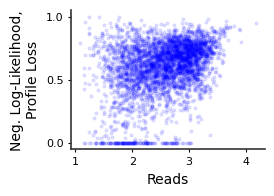

Pearson r: 0.045594708328938804


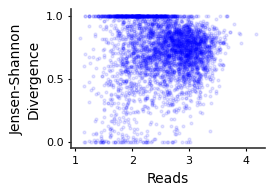

Pearson r: 0.10435851869877048


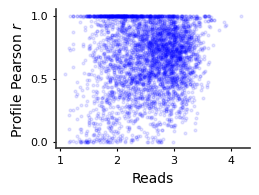

In [32]:
def norm_metrics_by_counts(val_metrics, true_counts, metric = "nll"):

    logcounts = np.log10(true_counts.sum(axis=-1))
    metrics = val_metrics[metric].squeeze()

    print("Pearson r:", np.corrcoef(logcounts, metrics)[0,1])

    plt.figure(figsize=(2.5, 1.8))

    plt.scatter(logcounts, metrics,
                s = 4, alpha=0.1, color="blue")

    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params(length=2)

    plt.yticks(fontsize=8)

    plt.ylabel(metric_names_fancy[metric], fontsize=10)

    plt.xticks(fontsize=8)
    plt.xlabel("Reads", fontsize=10)

    plt.show()
        
for metric_name in ["nll", "jsd", "profile_pearson"]:
    norm_metrics_by_counts(norm_val_metrics, true_counts, metric_name)

In [33]:
from common_functions import get_orientation_indexes, get_norm_shannon_entropies

#norm_shannon_entropies = get_norm_shannon_entropies(true_profs, true_counts)

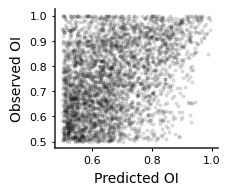

/mnt/lab_data2/kcochran/new_procap_models/src/figure_notebooks/common_functions.py:4: RuntimeWarning: invalid value encountered in true_divide
  return np.max(profiles.sum(axis=-1), axis=-1) / np.sum(profiles, axis=(-1,-2))


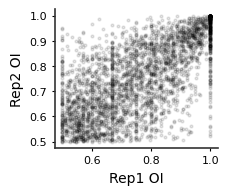

In [35]:
def pred_vs_observed_vs_reps_ois(true_profs, pred_profs, r1_profs, r2_profs):

    true_ois = get_orientation_indexes(true_profs)
    pred_ois = get_orientation_indexes(np.exp(pred_profs))

    atleast100_reads = true_profs.sum(axis=(-1,-2)) >= 100

    plt.figure(figsize=(2.1, 1.8))

    plt.scatter(pred_ois[atleast100_reads],
                true_ois[atleast100_reads],
                s = 4, alpha=0.1, color="k")

    plt.xlabel("Predicted OI", fontsize=10)
    plt.ylabel("Observed OI", fontsize=10)
    
    # aesthetics
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params(length=2, labelsize=8)

    plt.show()


    r1_ois = get_orientation_indexes(r1_profs)
    r2_ois = get_orientation_indexes(r2_profs)

    plt.figure(figsize=(2.1, 1.8))

    plt.scatter(r1_ois[atleast100_reads],
                r2_ois[atleast100_reads],
                s = 4, alpha=0.1, color="k")

    plt.xlabel("Rep1 OI", fontsize=10)
    plt.ylabel("Rep2 OI", fontsize=10)
    
    # aesthetics
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params(length=2, labelsize=8)

    plt.show()
        
pred_vs_observed_vs_reps_ois(true_profs, log_pred_profs, r1_profs, r2_profs)

K562


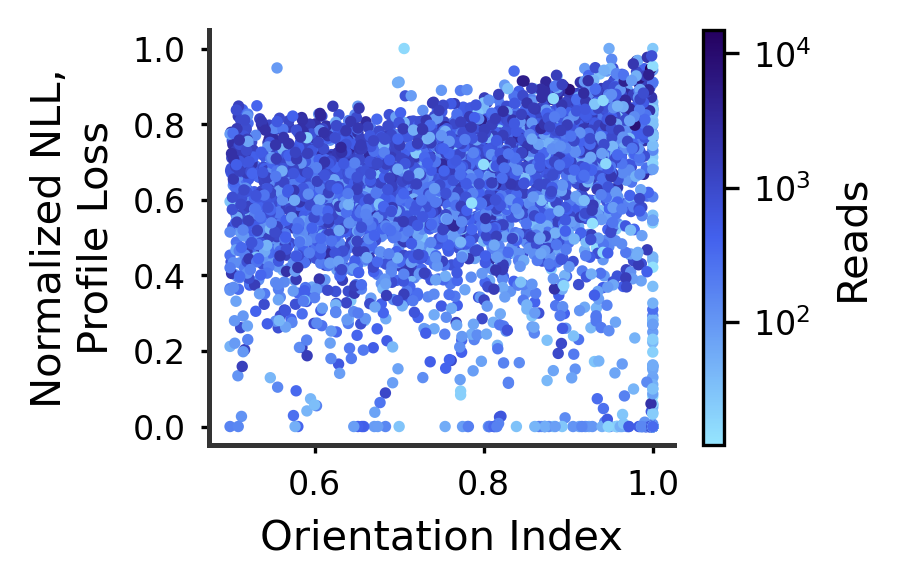

A673


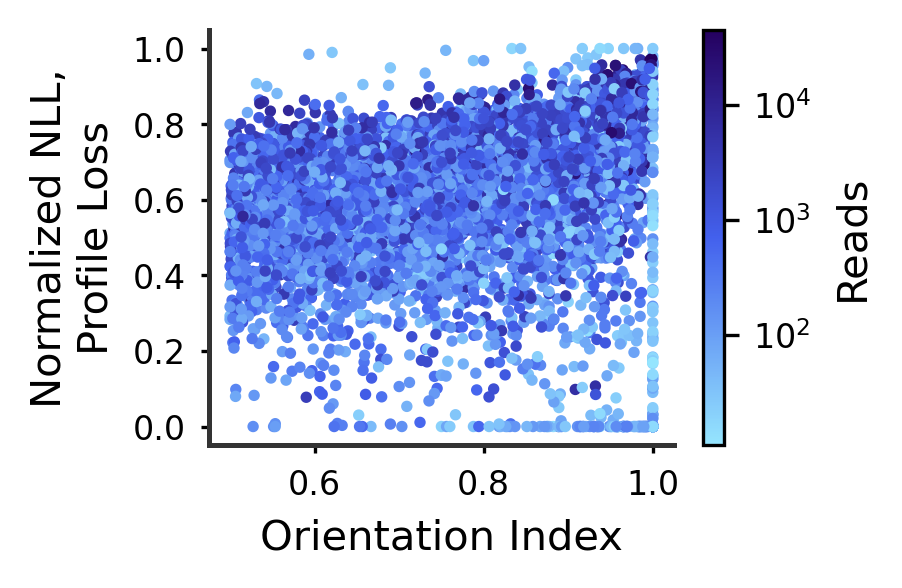

CACO2


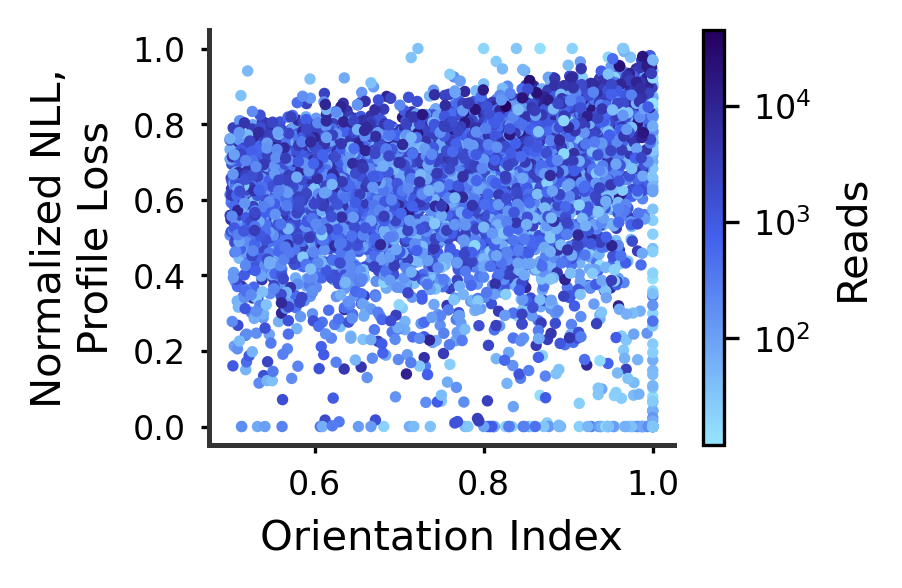

CALU3


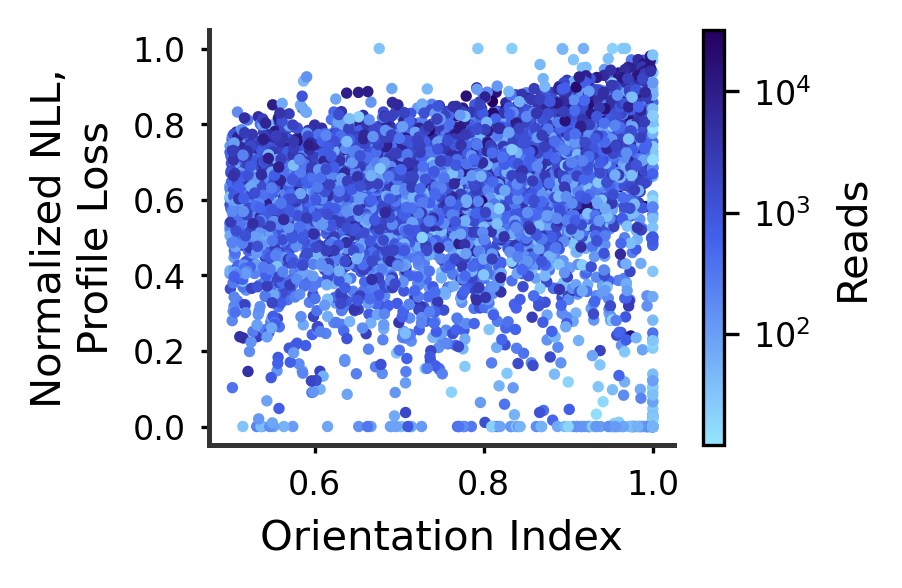

HUVEC


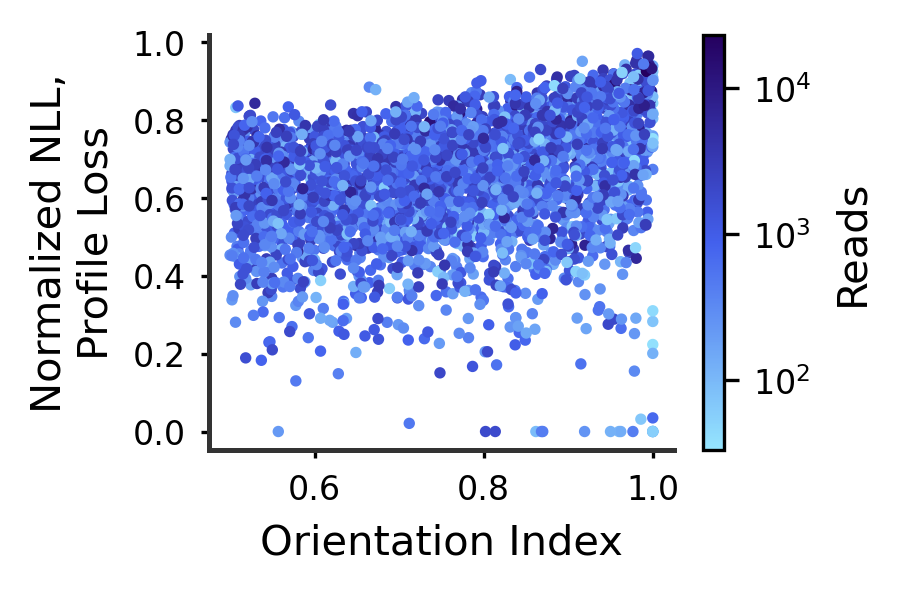

MCF10A


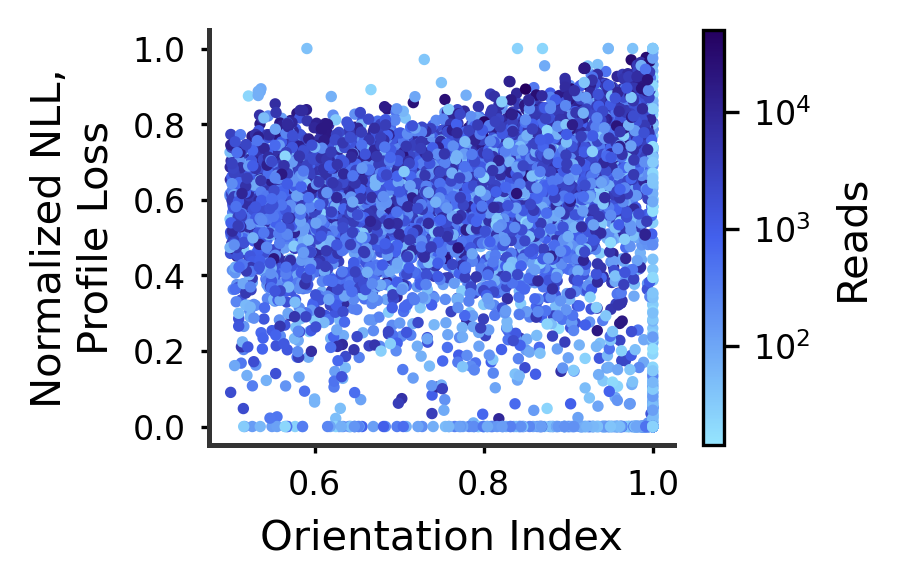

K562


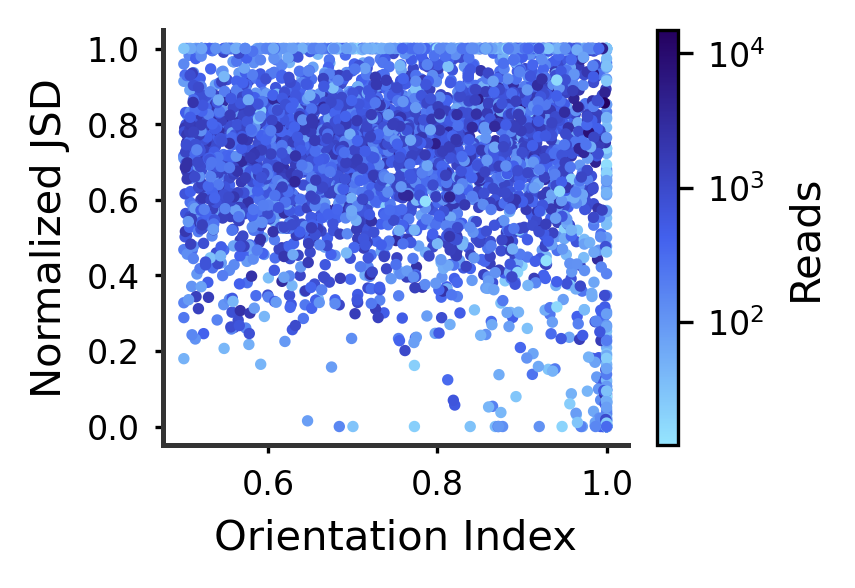

A673


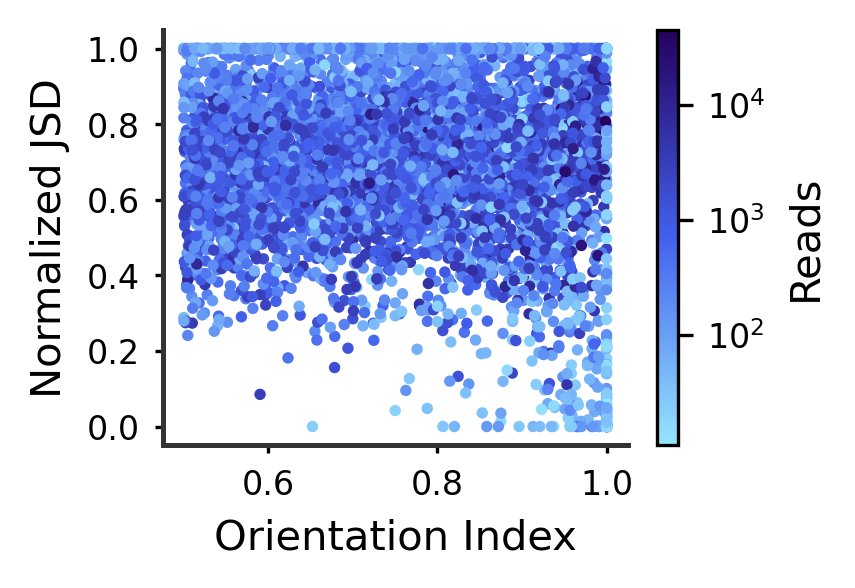

CACO2


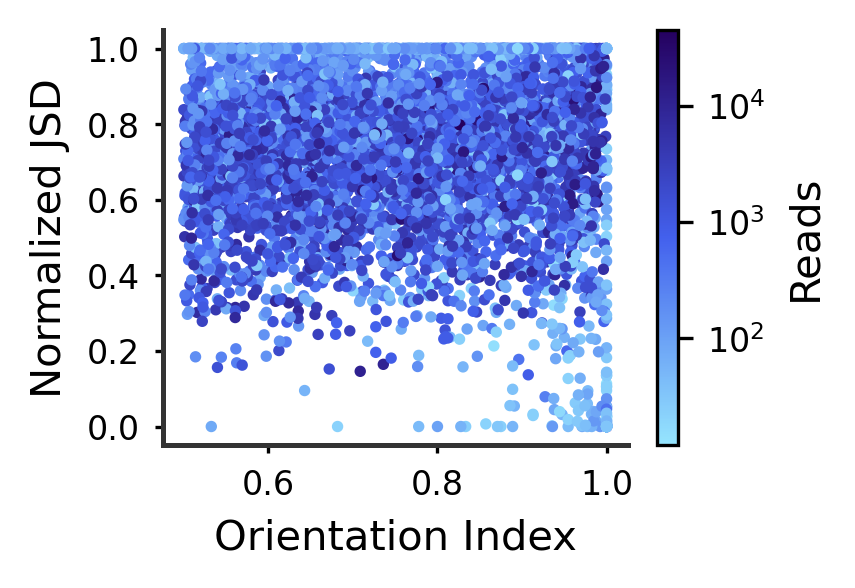

CALU3


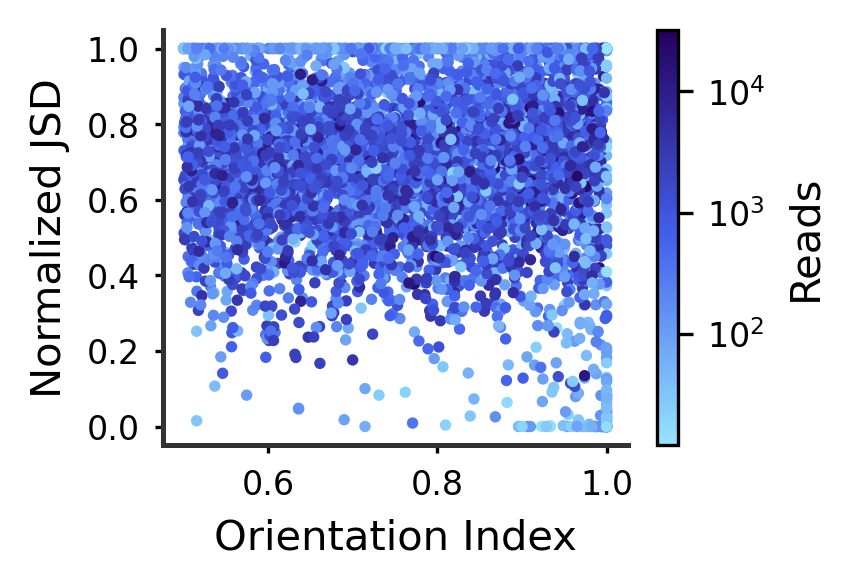

HUVEC


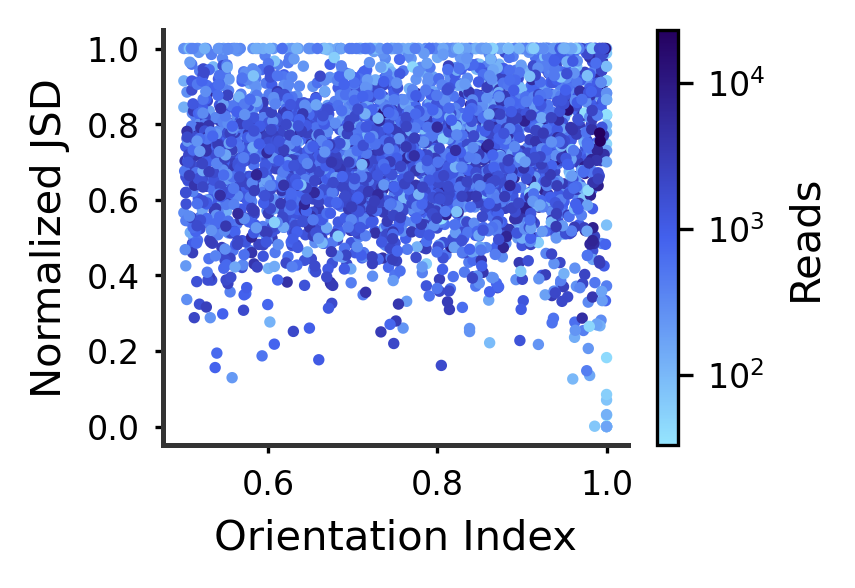

MCF10A


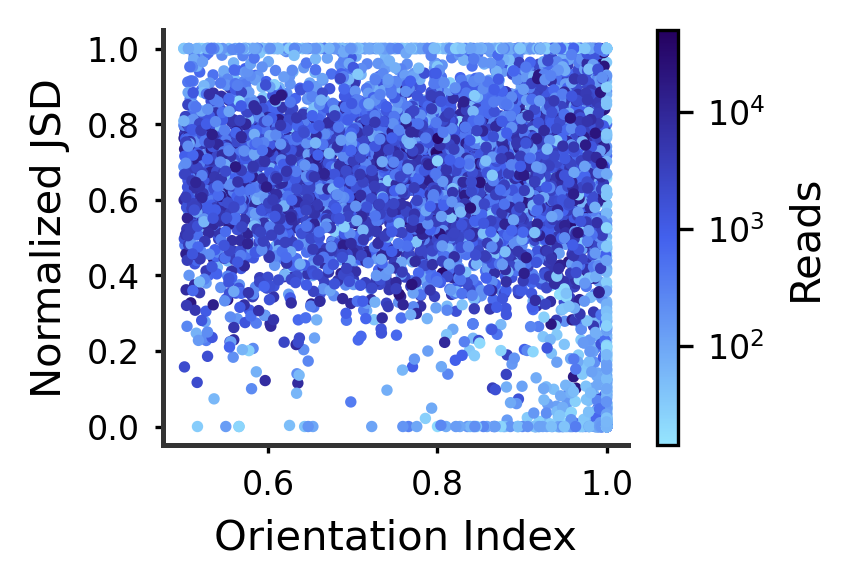

K562


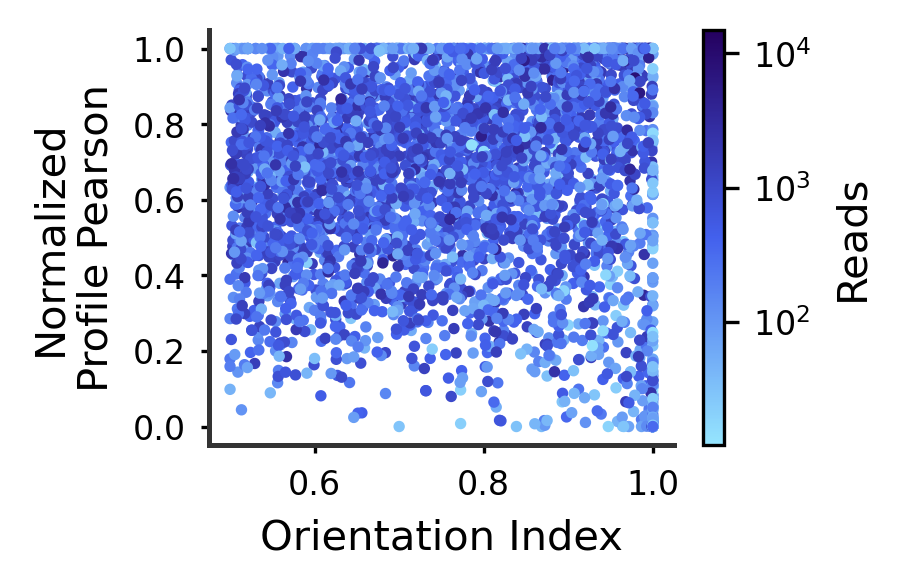

A673


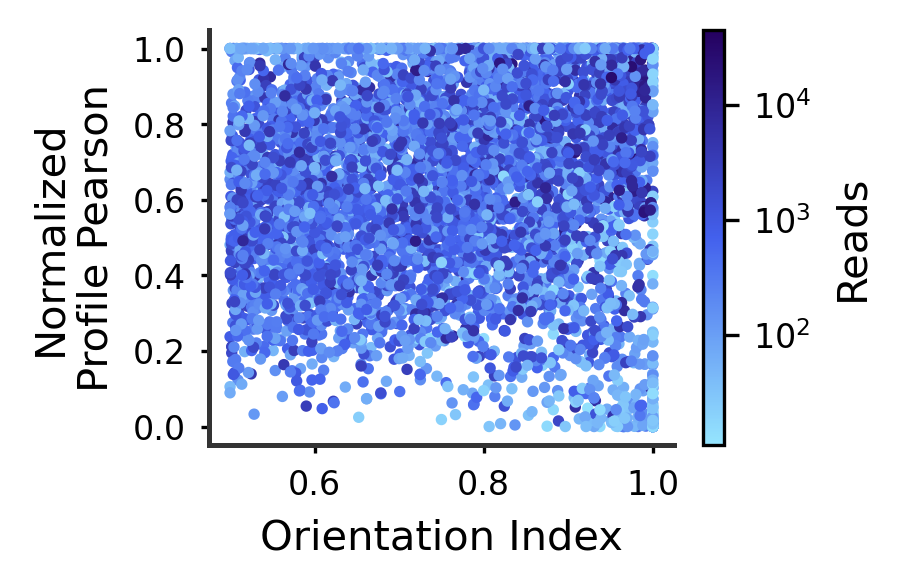

CACO2


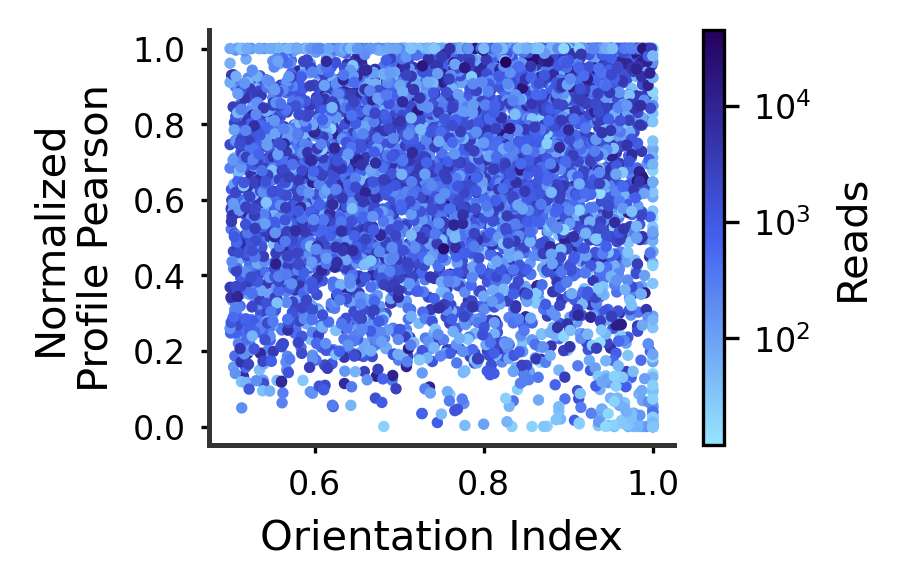

CALU3


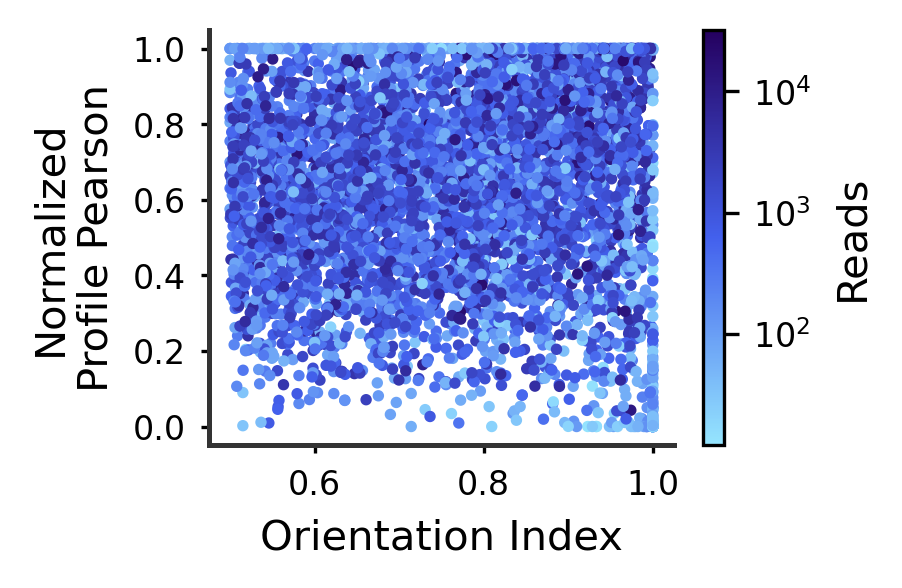

HUVEC


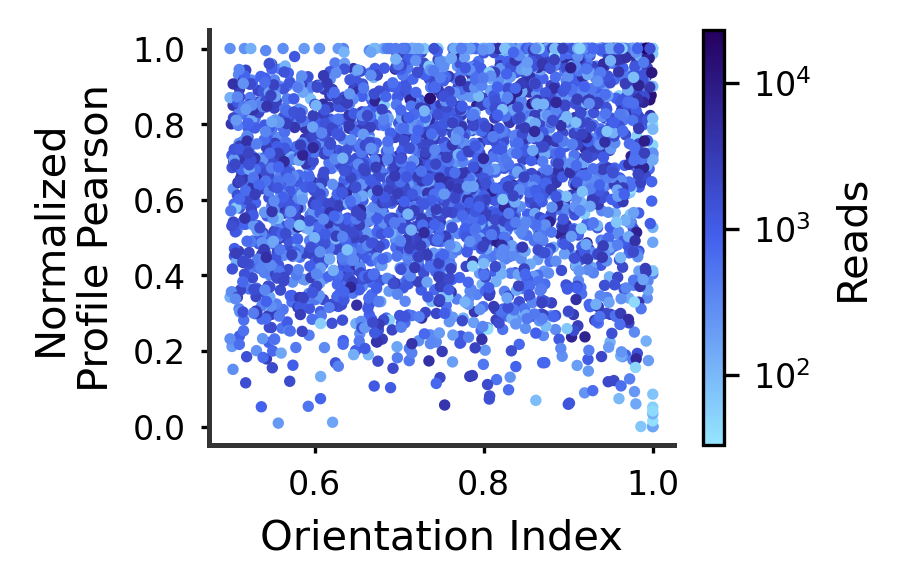

MCF10A


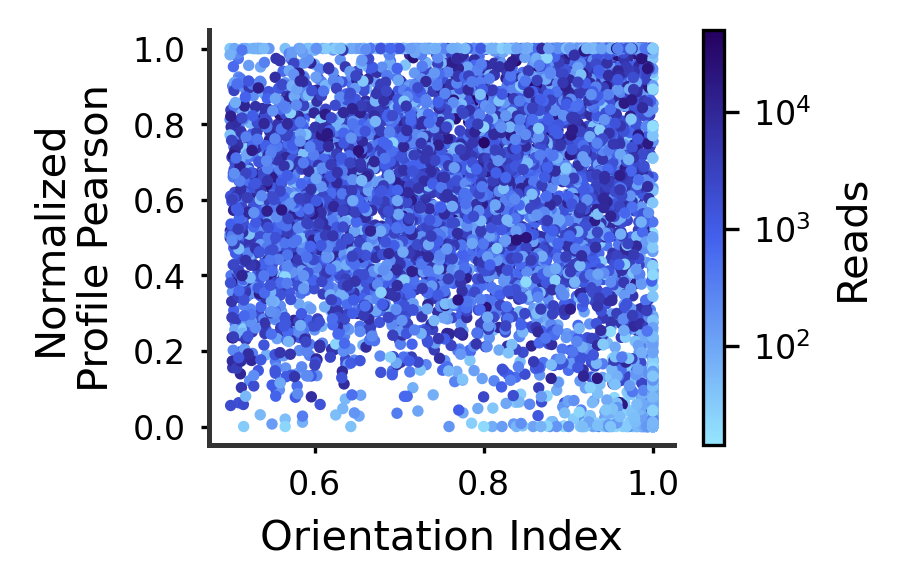

In [36]:
def metrics_by_orientation_index_and_counts(val_metrics, true_profs, true_counts, cell_types, metric = "nll"):
    metric_names = {"nll" : "Normalized NLL,\nProfile Loss",
                    "jsd" : "Normalized JSD",
                    "profile_pearson" : "Normalized\nProfile Pearson"}

    for cell_type in cell_types:
        print(cell_type)
        data = val_metrics[cell_type][metric]
        
        plt.figure(figsize=(2.5, 1.8), dpi=300)

        cmap = get_continuous_cmap(["#96E6FF", "#4361EE", "#25005F"])
        plt.scatter(get_orientation_indexes(true_profs[cell_type]),
                    data,
                    c = np.log10(true_counts[cell_type].sum(axis=-1)),
                    s = 3, alpha=1, cmap=cmap)
        
        ax = plt.gca()
        ax.spines[["left", "bottom"]].set_linewidth(1.2)
        ax.spines[["left", "bottom"]].set_color("#333333")
        ax.spines[["top", "right"]].set_visible(False)
        ax.tick_params(length=2, labelsize=8)
        
        plt.xlabel("Orientation Index", fontsize=10)
        plt.ylabel(metric_names[metric], fontsize=10)
        
        cb = plt.colorbar(pad=0.05)
        cb.ax.tick_params(labelsize=8)
        cb.ax.set_yticks(range(2,5))
        cb.ax.set_yticklabels([r'$10^' + str(i) + r'$' for i in cb.ax.get_yticks()])
        cb.set_label(label="Reads", fontsize=10, labelpad=5)
        
        plt.show()
        
for metric_name in ["nll", "jsd", "profile_pearson"]:
    metrics_by_orientation_index_and_counts(norm_val_metrics, true_profs, true_counts, cell_types, matric_name)

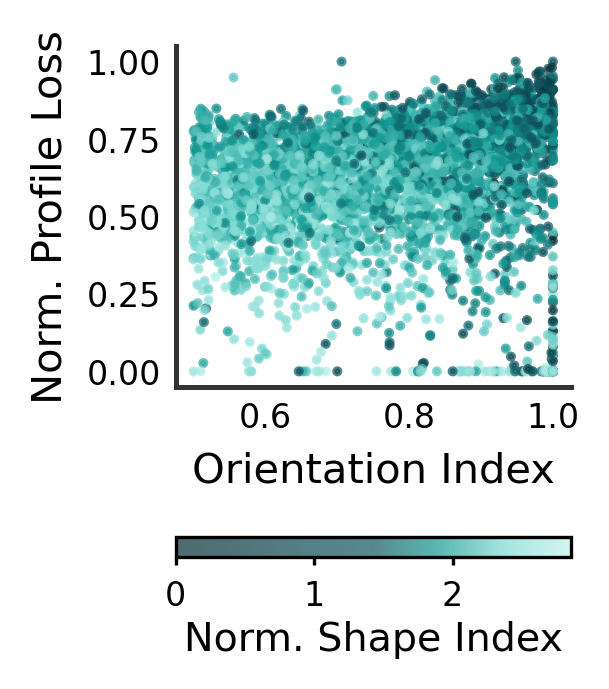

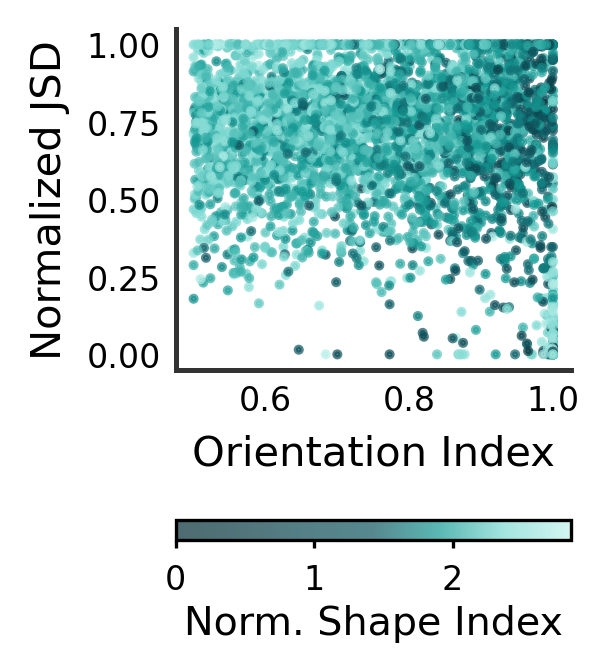

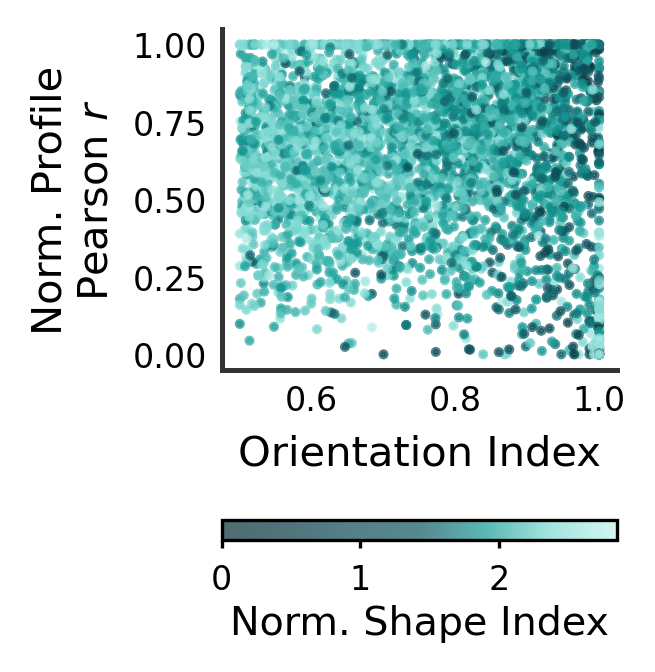

In [46]:
norm_metric_names_fancy = {"nll" : "Norm. Profile Loss",
                           "jsd" : "Normalized JSD",
                           "profile_pearson" : "Norm. Profile\nPearson " + r'$r$'}

def metrics_by_oi_and_nsi(val_metrics, true_profs, true_counts, metric = "nll"):

    metric_vals = val_metrics[metric]

    plt.figure(figsize=(1.7, 2.5), dpi=300)

    colors = ["#032D34", "#073A42", "#0D4B55", "#105661", "#149A94", "#7FDBD4", "#C1F3ED"]
    cmap = get_continuous_cmap(colors)
    
    plt.scatter(get_orientation_indexes(true_profs),
                metric_vals,
                c = get_norm_shannon_entropies(true_profs, true_counts),
                s = 2, alpha=0.7, cmap=cmap)

    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.tick_params(length=0, labelsize=8)

    plt.xlabel("Orientation Index", fontsize=10)
    plt.ylabel(norm_metric_names_fancy[metric], fontsize=10)

    cb = plt.colorbar(pad=0.26, orientation="horizontal")
    cb.ax.tick_params(labelsize=8, length=2)
    cb.set_label(label="Norm. Shape Index", fontsize=9.5, labelpad=2)

    plt.show()
        

for metric_name in ["nll", "jsd", "profile_pearson"]:
    metrics_by_oi_and_nsi(norm_val_metrics, true_profs, true_counts, metric_name)

## Supplementary Figures

In [77]:
from motif_hits_utils import load_motif_hits

def load_motif_hits_all_cells(cell_type, timestamp, model_type, data_type,
                              task = "profile", fdr = 0.05):

    hits, hits_in_peaks, hits_in_peaks_counts = load_motif_hits(cell_type, model_type,
                                                                timestamp,
                                                                tasks=[task],
                                                                fdr_cutoff=fdr,
                                                                filter_to_val_peaks=True)
    return hits[task], hits_in_peaks[task], hits_in_peaks_counts[task]

motif_hits_dfs, peak_hits, peak_hit_counts = load_motif_hits_all_cells(cell_type,
                                                                       timestamp,
                                                                       model_type,
                                                                       data_type)

Timestamp: 2022-10-05_03-39-32
Timestamp: 2022-10-05_03-39-32


In [75]:
# This is specific to K562 and the specific profile Modisco run

motif_keys_to_labels = ["BRE/SP", "CA-Inr", "GABPA", "NFY", "NRF1", "ATF1",
                        "YY1", "TA-Inr", "TATA", "THAP11",
                        "AP1",  "CTCF", "ZBTB33"]

In [78]:
def get_filter_for_peaks_with_motif(peak_hit_counts, motif_key_labels, motifs_to_find):
    motif_bools = dict()
    for motif in motifs_to_find:
        assert motif in motif_key_labels, (motif, motif_key_labels)
        motif_index = motif_key_labels.index(motif)
        motif_bools[motif] = peak_hit_counts[:, motif_index] > 0

    return motif_bools

motif_filters = get_filter_for_peaks_with_motif(peak_hit_counts,
                                                motif_keys_to_labels,
                                                ["TATA"]) # used to have CA-Inr, TA-Inr

In [49]:
from load_annotations_utils import load_coords_with_summits

def load_coords(cell_type, timestamp, model_type, data_type):
    config = ValFilesConfig(cell_type, model_type, timestamp, data_type)
    return load_coords_with_summits(config.val_peak_path,
                                    config.in_window)

coords = load_coords(cell_type, timestamp, model_type, data_type)

Timestamp: 2022-10-05_03-39-32


In [52]:
from load_annotations_utils import find_peak_overlap_labels, get_ccre_bed

def load_ccre_annots(cell_type, coords, in_window=in_window, out_window=out_window):
    return find_peak_overlap_labels(coords, get_ccre_bed(cell_type),
                                    in_window, out_window) 

ccre_annots = load_ccre_annots(cell_type, coords)

In [54]:
ccre_annots["PLS_no_pELS"] = ccre_annots["PLS"] * (~ ccre_annots["pELS"])
ccre_annots["PLS_with_pELS"] = ccre_annots["PLS"] * ccre_annots["pELS"]

In [55]:
from load_annotations_utils import find_peak_overlap

housekeeping_genes_bed = get_proj_dir() + "/annotations/hk_promoters_by_transcripts.bed"
hk_annots = find_peak_overlap(coords, housekeeping_genes_bed)

tct_promoters_bed = get_proj_dir() + "/annotations/tct_promoters.bed"
tct_annots = find_peak_overlap(coords, tct_promoters_bed)

In [56]:
from load_annotations_utils import get_gene_region_overlap 

gene_regions_files = {"genes" : get_proj_dir() + "/annotations/gene_regions.bed",
                      "TSSs" : get_proj_dir() + "/annotations/TSSs.bed",
                      "promoters" : get_proj_dir() + "/annotations/promoters.bed",
                      "intergenic" : get_proj_dir() + "/annotations/intergenic_regions.bed",
                      "exons" : get_proj_dir() + "/annotations/exons.bed",
                      "introns" : get_proj_dir() + "/annotations/introns.bed",
                      "utrs" : get_proj_dir() + "/annotations/utrs.bed"}

gene_region_annots = get_gene_region_overlap(coords, gene_regions_files)

In [57]:
from load_annotations_utils import get_dist_to_TSS

TSS_dists = get_dist_to_TSS(coords, gene_regions_files["TSSs"])

In [58]:
# we will want to label regions as not-promoter anything, only if they aren't also a promoter

gene_region_names = list(gene_region_annots.keys())
for region in gene_region_names:
    if "promoters" in region or "TSSs" in region:
        continue
    if "_not_TSS" in region:  # this is here to avoid bugs if you re-run this cell again
        continue
        
    gene_region_annots[region + "_not_TSS"] = gene_region_annots[region] * (~ gene_region_annots["promoters"])

In [59]:
ccre_annots["PLS"].sum()

2136

In [60]:
(ccre_annots["PLS"] * gene_region_annots["promoters"]).sum()

1921

In [61]:
(gene_region_annots["genes"] * gene_region_annots["intergenic"]).sum()

863

In [62]:
# 759 out of 863 genic-intergenic peaks are actually annotated as promoters
(gene_region_annots["genes"] * gene_region_annots["intergenic"] * ccre_annots["PLS"]).sum()

759

In [63]:
# all 759 of those overlap an exon annotation as well, makes sense
(gene_region_annots["genes"] * gene_region_annots["intergenic"] * gene_region_annots["exons"] * ccre_annots["PLS"]).sum()

759

In [64]:
# most of the 759 overlap a UTR annotation (so are for coding genes)
(gene_region_annots["genes"] * gene_region_annots["intergenic"] * gene_region_annots["utrs"] * ccre_annots["PLS"]).sum()

705

In [65]:
# most annotated promoters (2035 / 2136) overlap with gene annotations
(gene_region_annots["genes"] * ccre_annots["PLS"]).sum()

2035

In [66]:
# 812 out of 863 genic-intergenic peaks are actually annotated as promoters or "proximal enhancers"
(gene_region_annots["genes"] * gene_region_annots["intergenic"] * np.logical_or(ccre_annots["pELS"], ccre_annots["PLS"])).sum()

812

In [67]:
[(k, sum(t)) for k, t in gene_region_annots.items()]

[('genes', 3269),
 ('TSSs', 1862),
 ('promoters', 2317),
 ('intergenic', 1428),
 ('exons', 2467),
 ('introns', 1898),
 ('utrs', 1862),
 ('genes_not_TSS', 1029),
 ('intergenic_not_TSS', 504),
 ('exons_not_TSS', 363),
 ('introns_not_TSS', 829),
 ('utrs_not_TSS', 145)]

In [69]:
len(coords), true_counts.sum(axis=-1).shape, ccre_annots["dELS"].shape

(3834, (3834,), (3834,))

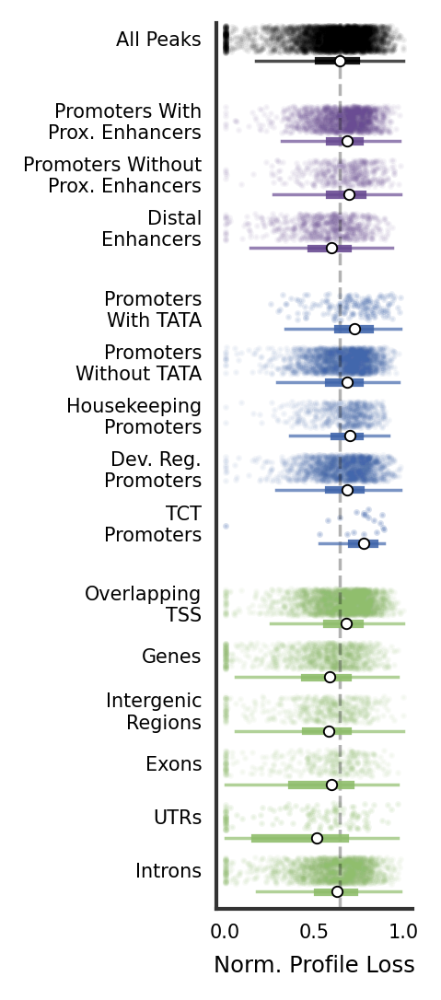

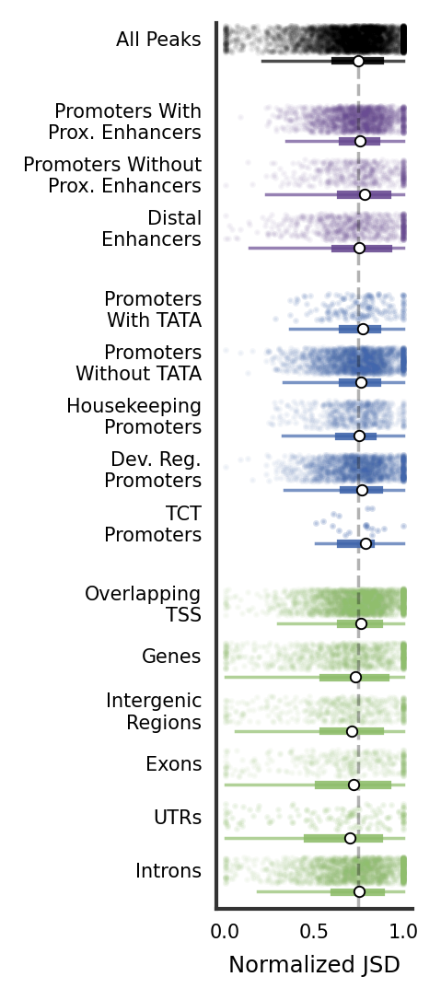

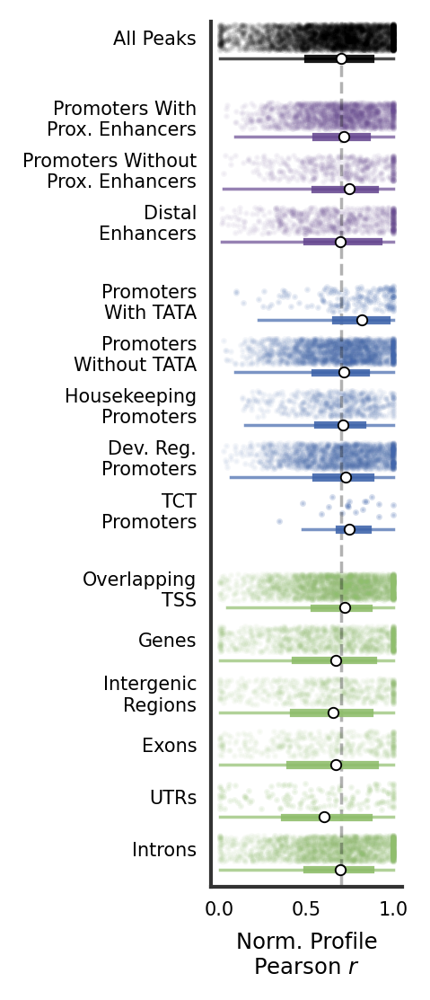

In [83]:
from plot_utils import jitter_dots, plot_scatter_and_boxplot


def plot_stratify(val_metrics, ccre_annots, hk_annots, tct_annots, gene_region_annots,
                  motif_filters, motif_keys_labels, metric = "nll"):
    
    annots_to_labels = {"PLS" : "Promoters",
                        "pELS" : "Proximal\nEnhancers",
                        "dELS" : "Distal\nEnhancers",
                        "PLS_with_pELS" : "Promoters With\nProx. Enhancers",
                        "PLS_no_pELS" : "Promoters Without\nProx. Enhancers"}
    
    regions_to_labels = {"promoters" : "Overlapping\nTSS",
                        "genes" : "Genes",
                        "genes_not_TSS" : "Genes",
                        "exons" : "Exons",
                        "exons_not_TSS" : "Exons",
                        "intergenic" : "Intergenic\nRegions",
                        "intergenic_not_TSS" : "Intergenic\nRegions",
                        "utrs" : "UTRs",
                        "utrs_not_TSS" : "UTRs",
                        "introns" : "Introns"}
    regions_to_plot = ["promoters", "genes_not_TSS", "intergenic_not_TSS",
                       "exons_not_TSS", "utrs_not_TSS", "introns"]

    annots_to_labels_hk =  {"hk" : "Housekeeping\nPromoters",
                             "not-hk" : "Dev. Reg.\nPromoters"}

    annots_to_labels_tct =  {"tct" : "TCT\nPromoters",
                             "not-tct" : "Non-TCT\nPromoters"}

    annots_to_plot = ["PLS_with_pELS", "PLS_no_pELS", "dELS"]
    
    metrics = val_metrics[metric].squeeze()
    
    y_labels = []
    
    plt.figure(figsize=(1.1, 5), dpi=250)

    plt.axvline(np.median(metrics), linestyle="dashed", alpha=0.3, color="k", linewidth=1)
    
    num_groups = 4
    groupings = [0] + [1]*len(annots_to_plot)
    for i in range(len(motif_filters)):
        groupings += [i + 2] * 2
    groupings += [len(motif_filters) + 1] * len(annots_to_labels_hk)
    groupings += [len(motif_filters) + 1] * (len(annots_to_labels_tct) - 1)
    groupings += [len(motif_filters) + 2] * len(regions_to_labels)
    assert max(groupings) == num_groups - 1, (num_groups, groupings)
    
    #color_list = ["k", "#6A4C93", "#4267AC", "#52A675", "#FFCA3A", "#FF924C", "#FF596F"]
    color_list = ["k", "#6A4C93", "#4267AC", "#90BE6D"]
    
    y_index = 0
    y_labels.append("All Peaks")
    plot_scatter_and_boxplot(metrics, y_index, color=color_list[groupings[y_index]])
    y_index += 1
    y_offset = 0.5
    yticks = [0]
    
    for annot_name in annots_to_plot:
        y_labels.append(annots_to_labels[annot_name])
        yticks.append(y_index + y_offset)

        plot_scatter_and_boxplot(metrics[ccre_annots[annot_name]],
                                 y_index + y_offset,
                                 color = color_list[groupings[y_index]])
        y_index += 1
    
    y_offset += 0.5
    
    for motif in motif_filters.keys():
        y_labels.append("Promoters\nWith " + motif)
        yticks.append(y_index + y_offset)

        plot_scatter_and_boxplot(metrics[ccre_annots["PLS"] * motif_filters[motif]],
                                 y_index + y_offset,
                                 color = color_list[groupings[y_index]])
        y_index += 1
        
        y_labels.append("Promoters\nWithout " + motif)
        yticks.append(y_index + y_offset)

        plot_scatter_and_boxplot(metrics[ccre_annots["PLS"] * (~ motif_filters[motif])],
                                 y_index + y_offset,
                                 color = color_list[groupings[y_index]])
        y_index += 1
    
    for annot_name in annots_to_labels_hk.keys():
        y_labels.append(annots_to_labels_hk[annot_name])
        yticks.append(y_index + y_offset)
        
        if annot_name == "hk":
            metrics_subset = metrics[ccre_annots["PLS"] * hk_annots]
        else:
            metrics_subset = metrics[ccre_annots["PLS"] * (~ hk_annots)]

        plot_scatter_and_boxplot(metrics_subset, y_index + y_offset,
                                 color = color_list[groupings[y_index]])
        y_index += 1
        
        
    for annot_name in annots_to_labels_tct.keys():
        if annot_name == "tct":
            y_labels.append(annots_to_labels_tct[annot_name])
            yticks.append(y_index + y_offset)

            plot_scatter_and_boxplot(metrics[ccre_annots["PLS"] * tct_annots],
                                     y_index + y_offset,
                                     color = color_list[groupings[y_index]])
            y_index += 1
        
    y_offset += 0.5
        
    for region_name in regions_to_plot:
        y_labels.append(regions_to_labels[region_name])
        yticks.append(y_index + y_offset)
        
        metrics_subset = metrics[gene_region_annots[region_name]]
        plot_scatter_and_boxplot(metrics_subset, y_index + y_offset,
                                 color = color_list[groupings[y_index]])
        y_index += 1
        
        
    plt.xlabel(norm_metric_names_fancy[metric], fontsize=7)
    
    # aesthetics
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.xaxis.set_ticks_position('none') 
    ax.yaxis.set_ticks_position('none')
    plt.tick_params(length=1, labelsize=6)
    
    plt.xticks([0, 0.5, 1])
    plt.yticks(yticks, y_labels)
    
    plt.ylim(plt.gca().get_ylim()[1] - 0.5, plt.gca().get_ylim()[0] + 0.5)
    
    plt.show()
    
    
for metric_name in ["nll", "jsd", "profile_pearson"]:
    plot_stratify(norm_val_metrics, ccre_annots,
                  hk_annots, tct_annots, gene_region_annots,
                  motif_filters, motif_keys_to_labels, metric=metric_name)

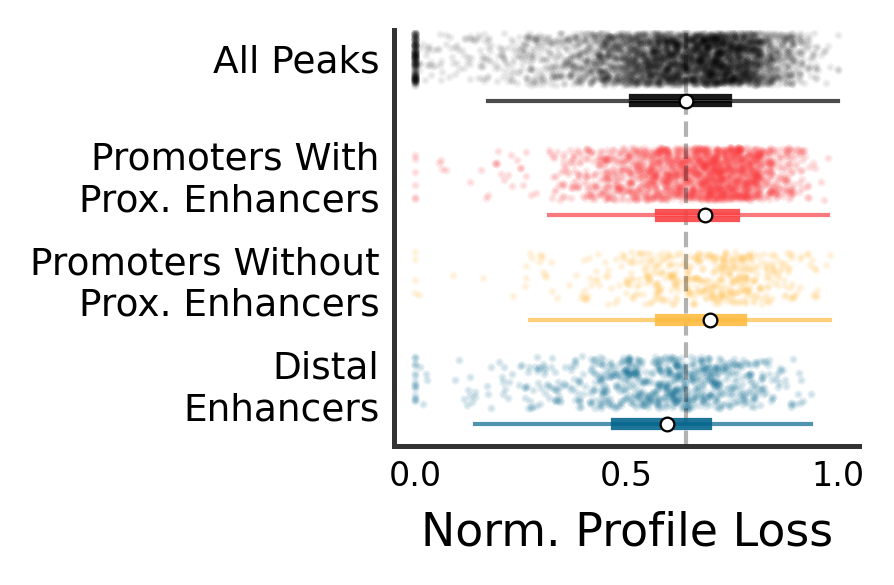

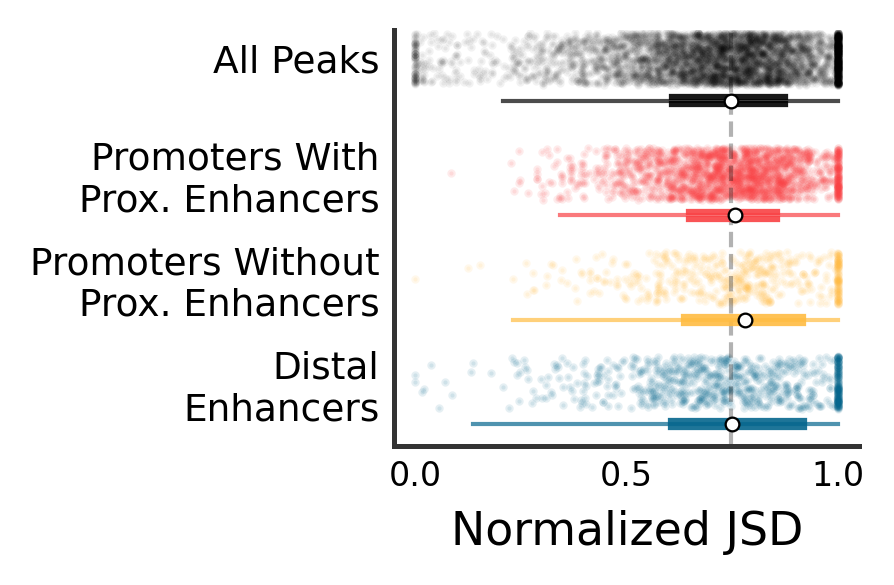

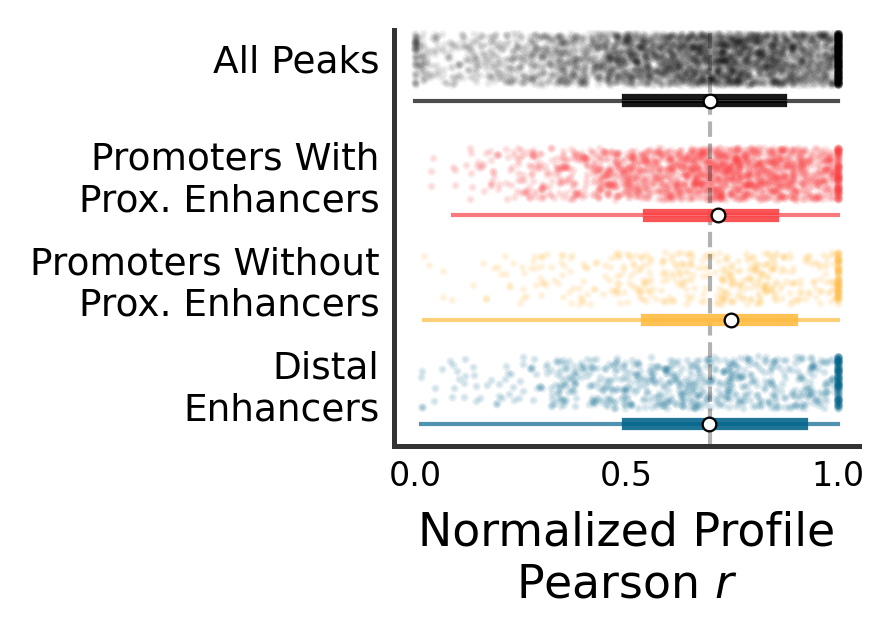

In [86]:
def plot_stratify_but_subset(val_metrics, ccre_annots, metric = "nll"):
    metric_names = {"nll" : "Norm. Profile Loss",
                    "jsd" : "Normalized JSD",
                    "profile_pearson" : "Normalized Profile\n" + r'Pearson $r$'}
    
    annots_to_colors = {"PLS" : "#f94144",
                        "pELS" : "#ffbc42",
                        "dELS" : "#05668d",
                        "PLS_with_pELS" : "#f94144",
                        "PLS_no_pELS" : "#ffbc42"}

    annots_to_labels = {"PLS" : "Promoters",
                        "pELS" : "Proximal\nEnhancers",
                        "dELS" : "Distal\nEnhancers",
                        "PLS_with_pELS" : "Promoters With\nProx. Enhancers",
                        "PLS_no_pELS" : "Promoters Without\nProx. Enhancers"}

    annots_to_plot = ["PLS_with_pELS", "PLS_no_pELS", "dELS"]

    metrics = val_metrics[metric].squeeze()
    
    
    
    plt.figure(figsize=(2, 1.8), dpi=300)

    plt.axvline(np.median(metrics), linestyle="dashed", alpha=0.3, color="k", linewidth=1)
    
    num_groups = 2
    groupings = [0] + [1]*len(annots_to_labels)
    assert max(groupings) == num_groups - 1, (num_groups, groupings)
    
    y_index = 0
    
    plot_scatter_and_boxplot(metrics, y_index, color="k")
    y_index += 1
    y_labels = ["All Peaks"]
    yticks = [0]
    y_offset = 0.1
    
    for annot_name in annots_to_plot:
        y_labels.append(annots_to_labels[annot_name])
        yticks.append(y_index + y_offset)
        metrics_subset = metrics[ccre_annots[annot_name]]
        plot_scatter_and_boxplot(metrics_subset, y_index + y_offset,
                                 color = annots_to_colors[annot_name],
                                 dot_alpha = 0.1)
        y_index += 1

    plt.xlabel(metric_names[metric], fontsize=11)
        
    # aesthetics
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.xaxis.set_ticks_position('none') 
    ax.yaxis.set_ticks_position('none')
    ax.tick_params(length=0)
    plt.xticks(fontsize=8)

    plt.yticks(yticks, y_labels, fontsize = 9)
    
    plt.ylim(plt.gca().get_ylim()[1], plt.gca().get_ylim()[0] - 0.1)
    
    plt.show()
    
for metric_name in ["nll", "jsd", "profile_pearson"]:
    plot_stratify_but_subset(norm_val_metrics, ccre_annots, metric=metric_name)

In [93]:
#weird_site_indexes = (norm_val_metrics["nll"] == 0).squeeze()
#weirdish_site_indexes = (norm_val_metrics["nll"] < 0.3).squeeze()
low_JSD_site_indexes = (norm_val_metrics["jsd"] < 0.1).squeeze()

In [111]:
np.array(coords)[(norm_val_metrics["jsd"] == 1).squeeze()]

array([['chr20', 16573925, 16576039, 16575055, 16574839],
       ['chr19', 46730152, 46732266, 46731296, 46731116],
       ['chr19', 35000082, 35002196, 35001143, 35001136],
       ...,
       ['chr19', 57577911, 57580025, 57579061, 57578907],
       ['chr19', 51326829, 51328943, 51327967, 51327874],
       ['chr19', 19224297, 19226411, 19225451, 19225260]], dtype=object)

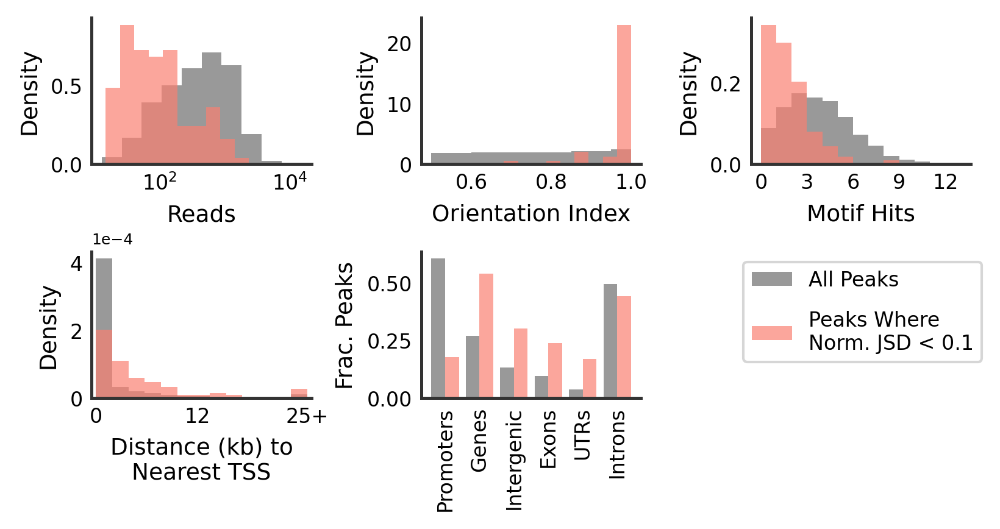

In [95]:
def make_ax_pretty(ax, linewidth=1.2, ax_color = "#333333", ticklabelsize=8):
    ax.spines[["left", "bottom"]].set_linewidth(linewidth)
    ax.spines[["left", "bottom"]].set_color(ax_color)
    ax.spines[["top", "right"]].set_visible(False)
    ax.xaxis.set_ticks_position('none') 
    ax.yaxis.set_ticks_position('none')
    
    ax.tick_params(length=0, labelsize=ticklabelsize)
    

def make_plots_for_outliers(outlier_indexes, true_profs, true_counts,
                               peak_hit_counts, gene_region_annots, TSS_dists):
    
    group_names = ["All Peaks", "Peaks Where\nNorm. JSD < 0.1"]
    
    regions_to_labels = {"promoters" : "Promoters",
                        "genes" : "Genes",
                        "genes_not_TSS" : "Genes",
                        "exons" : "Exons",
                        "exons_not_TSS" : "Exons",
                        "intergenic" : "Intergenic",
                        "intergenic_not_TSS" : "Intergenic",
                        "utrs" : "UTRs",
                        "utrs_not_TSS" : "UTRs",
                        "introns" : "Introns"}
    regions_to_plot = ["promoters", "genes_not_TSS", "intergenic_not_TSS",
                       "exons_not_TSS", "utrs_not_TSS", "introns"]
    
    
    fig, axes = plt.subplots(2, 3, figsize=(6.2,2.7), dpi=300)
    plt.subplots_adjust(wspace=0.5, hspace=0.6)
    axes = axes.flatten()
    
    # Counts histogram
    
    log_all_true_counts = np.log10(true_counts.sum(axis=1) + 1)
    log_outlier_true_counts = np.log10(true_counts[outlier_indexes].sum(axis=1) + 1)
    
    axes[0].hist(log_all_true_counts, alpha=0.8, density=True, color="gray")
    axes[0].hist(log_outlier_true_counts, alpha=0.7, density=True, color="salmon")
    
    axes[0].set_xlabel("Reads", fontsize=9)
    axes[0].set_ylabel("Density", fontsize=9)
    
    xticks = [2,4]
    axes[0].set_xticks(xticks, [r'$10^{' + str(i) + r'}$' for i in xticks])
    
    # OI histogram
    
    ois = get_orientation_indexes(true_profs)
    
    axes[1].hist(ois,
                 alpha=0.8, density=True, color="gray")
    axes[1].hist(ois[outlier_indexes],
                 alpha=0.7, density=True, color="salmon")
    
    axes[1].set_xlabel("Orientation Index", fontsize=9)
    axes[1].set_ylabel("Density", fontsize=9)
    
    # Motif hits histogram
    
    motif_hits = peak_hit_counts.sum(axis=1)
    axes[2].hist(motif_hits,
             bins=range(14), alpha=0.8, density=True, color="gray")
    axes[2].hist(motif_hits[outlier_indexes],
             bins=range(14), alpha=0.7, density=True, color="salmon")
    
    axes[2].set_xlabel("Motif Hits", fontsize=9)
    axes[2].set_ylabel("Density", fontsize=9)
    
    axes[2].set_xticks(range(0,14,3))
    
    # TSS distances histogram

    stop_point = 25000
    num_bins = int(np.ceil(stop_point / 2000))
    axes[3].hist([min(d, stop_point) for d in TSS_dists if d is not None],
             density=True, bins=num_bins,
             alpha=0.8, color="gray")
    axes[3].hist([min(d, stop_point) for d in TSS_dists[outlier_indexes] if d is not None],
             density=True, bins=num_bins,
             alpha=0.7, color="salmon")

    axes[3].set_xlim(-500, stop_point + 500)
    axes[3].set_xlabel("Distance (kb) to\nNearest TSS", fontsize=9)
    axes[3].set_ylabel("Density", fontsize=9)
    axes[3].ticklabel_format(axis="y", style="scientific", scilimits=(0,0))
    axes[3].yaxis.offsetText.set_fontsize(6)
    
    middle_tick = int(stop_point / 2000) * 1000
    axes[3].set_xticks([0, middle_tick, stop_point],
                       ["0", middle_tick // 1000, str(stop_point // 1000) + "+"])
    
    # Gene annotation regions double bar plot

    fracs_overall = []
    fracs_in_region = []
    for region_name in regions_to_plot:
        region_bools = gene_region_annots[region_name]
        frac_overall = sum(region_bools) / len(region_bools)
        frac_in_region = sum(region_bools[outlier_indexes]) / len(region_bools[outlier_indexes])
        fracs_overall.append(frac_overall)
        fracs_in_region.append(frac_in_region)

    barplot_x_vals = np.arange(len(fracs_overall))
    bar_width = 0.4
    b1 = axes[4].bar(barplot_x_vals, fracs_overall,
                 width=bar_width, label=group_names[0], color="gray", alpha=0.8)
    # Same thing, but offset the x.
    b2 = axes[4].bar(barplot_x_vals + bar_width, fracs_in_region,
                 width=bar_width, label=group_names[1], color="salmon", alpha=0.7)

    # x axis ticks need to be offset to go under center of two bars
    axes[4].set_xticks(barplot_x_vals + bar_width / 2,
                       labels=[regions_to_labels[region_name] for region_name in regions_to_plot],
                       rotation=90, fontsize=6)
    axes[4].set_ylabel("Frac. Peaks", fontsize=9)

    # will function as legend for all subplots
    axes[4].legend(bbox_to_anchor=(1.42,1), loc="upper left",
               frameon=True, labelspacing=1, fontsize=8)
    
    
    # cosmetics for each subplot
    for axis in axes:
        make_ax_pretty(axis)
    
    # disappear unused axis
    axes[-1].remove()
    
    plt.show()
    
    
make_plots_for_outliers(low_JSD_site_indexes, true_profs, true_counts,
                           peak_hit_counts, gene_region_annots, TSS_dists)

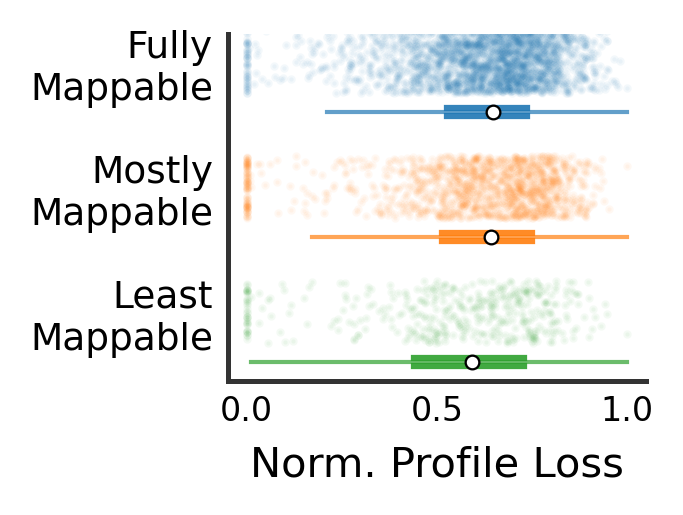

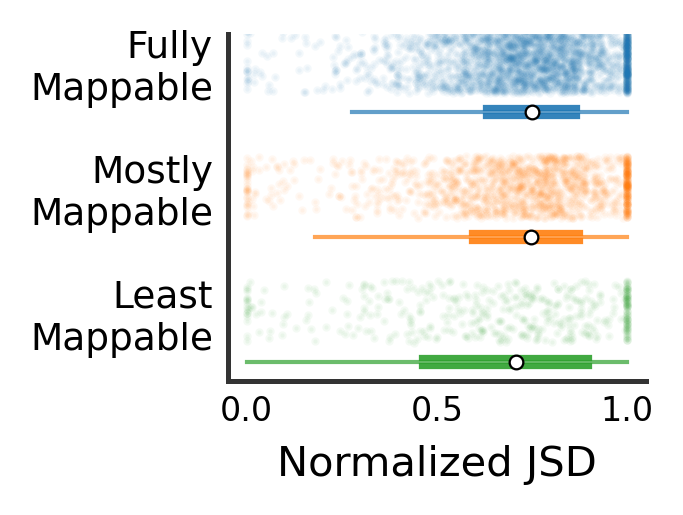

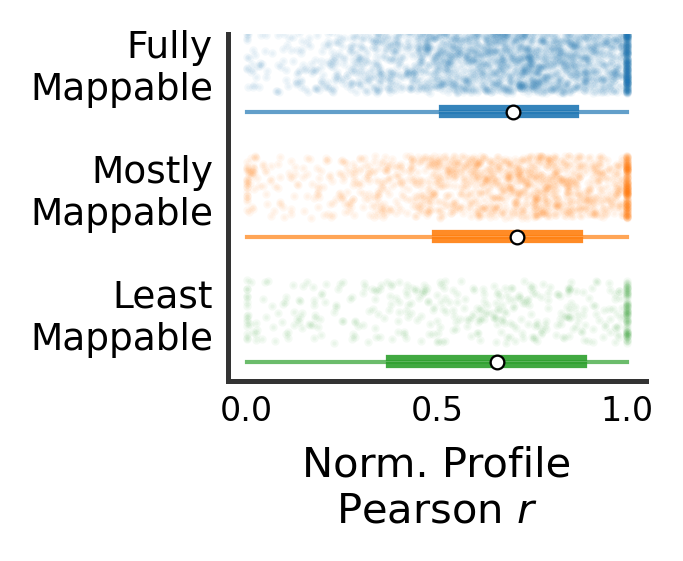

In [97]:
def plot_mappability_vs_performance(val_metrics, umap_masks, metric = "nll"):
    umap_frac = umap_masks.mean(axis=(1,2))  # axis 1 is just 2 copies anyways

    umap_all_mappable = umap_frac == 1
    umap_mostly_mappable = (umap_frac < 1) * (umap_frac >= 0.7)
    umap_least_mappable = umap_frac < 0.7

    plt.figure(figsize=(1.8, 1.5), dpi=300)
    
    y_labels = []
    y_index = 0
    y_labels.append("Fully\nMappable")
    plot_scatter_and_boxplot(val_metrics[metric][umap_all_mappable], y_index, color="tab:blue")
    y_index += 1
    
    y_labels.append("Mostly\nMappable")
    plot_scatter_and_boxplot(val_metrics[metric][umap_mostly_mappable], y_index, color="tab:orange")
    y_index += 1
    
    y_labels.append("Least\nMappable")
    plot_scatter_and_boxplot(val_metrics[metric][umap_least_mappable], y_index, color="tab:green")
    y_index += 1

    plt.xlabel(norm_metric_names_fancy[metric])
        
    ax = plt.gca()
    ax.spines[["left", "bottom"]].set_linewidth(1.2)
    ax.spines[["left", "bottom"]].set_color("#333333")
    ax.spines[["top", "right"]].set_visible(False)
    ax.xaxis.set_ticks_position('none') 
    ax.yaxis.set_ticks_position('none')

    ax.tick_params(length=0)
    plt.xticks(fontsize=8)

    plt.yticks(range(len(y_labels)), y_labels, fontsize = 9)
    plt.ylim(plt.gca().get_ylim()[1], plt.gca().get_ylim()[0] - 0.1)
    
    plt.show()



for metric_name in ["nll", "jsd", "profile_pearson"]:
    plot_mappability_vs_performance(norm_val_metrics, umap_masks, metric=metric_name)

## Individual Examples

In [98]:
def load_train_val_data(cell_type, timestamp, model_type, data_type):
    config = ValFilesConfig(cell_type, model_type, timestamp, data_type)

    _, true_profs = extract_peaks(config.genome_path,
                                  config.chrom_sizes,
                                  config.plus_bw_path,
                                  config.minus_bw_path,
                                  config.train_val_peak_path,
                                  in_window=config.in_window,
                                  out_window=config.out_window,
                                  max_jitter=0, verbose=True)

    true_counts = true_profs.sum(axis=-1).squeeze()

    log_pred_profs = np.load(config.pred_profiles_train_val_path)
    pred_logcounts = np.load(config.pred_logcounts_train_val_path).squeeze()
        
    return true_profs, true_counts, log_pred_profs, pred_logcounts


train_val_true_profs, train_val_true_counts, \
train_val_log_pred_profs, train_val_pred_logcounts = load_train_val_data(cell_type,
                                                                        timestamp,
                                                                        model_type,
                                                                        data_type)

Timestamp: 2022-10-05_03-39-32
Loading genome sequence from /mnt/lab_data2/kcochran/new_procap_models/genomes/hg38.withrDNA.fasta


Reading FASTA: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:09<00:00,  2.51it/s]
Loading Peaks: 27000it [00:47, 568.17it/s]


== In Extract Peaks ==
Peak filepath: /mnt/lab_data2/kcochran/new_procap_models/data/procap/processed/K562/peaks_uni_and_bi_train_and_val.bed.gz
Sequence length (with jitter): 2114
Profile length (with jitter): 1000
Max jitter applied: 0
Num. Examples: 27000
Mask loaded? False


In [99]:
from file_configs import DeepshapFilesConfig

def load_scores(cell_type, timestamp, model_type, data_type):
    config = DeepshapFilesConfig(cell_type, model_type, timestamp, data_type)
        
    prof_scores = np.load(config.profile_onehot_scores_path)
    counts_scores = np.load(config.counts_onehot_scores_path)
    return prof_scores, counts_scores

prof_scores, counts_scores = load_scores(cell_type, timestamp, model_type, data_type)

Timestamp: 2022-10-05_03-39-32


In [100]:
from load_annotations_utils import load_coords_with_summits

def load_coords_train_val(cell_type, timestamp, model_type, data_type):
    config = ValFilesConfig(cell_type, model_type, timestamp, data_type)
    return load_coords_with_summits(config.train_val_peak_path,
                                    config.in_window)

train_val_coords = load_coords_train_val(cell_type, timestamp, model_type, data_type)

Timestamp: 2022-10-05_03-39-32


In [102]:
def overlap(coord1, coord2):
    # chromosome should be the same
    if coord1[0] != coord2[0]:
        return False
    if coord2[2] < coord1[1]:
        return False
    if coord2[1] > coord1[2]:
        return False
    return True

def get_locus_index(coords, chrom, start, end):
    assert type(chrom) == str, chrom
    assert type(start) == int, start
    assert type(end) == int, end
    coord_to_find = (chrom, start, end)
    
    match_indexes = []
    matches = []
    for index, coord in enumerate(coords):
        if overlap(coord, coord_to_find):
            matches.append(coord)
            match_indexes.append(index)
            
    if len(matches) == 0:
        print("Coordinate not found :(")
        return None
    elif len(matches) > 1:
        print(str(len(matches)) + " matches to coordinate found: ", coord_to_find)
    else:
        print(coord_to_find, "--->", matches[0])
        return match_indexes[0], matches[0]
        
    mid_for_coord_to_find = (start + end) // 2
    dists_for_matches = [abs(((c[1] + c[2]) // 2) - mid_for_coord_to_find) for c in matches]
    closest_match_index = match_indexes[np.argmin(dists_for_matches)]
    closest_match = matches[np.argmin(dists_for_matches)]
    
    print(coord_to_find, "--->", closest_match)
    
    return closest_match_index, closest_match
        

tal1_altpromoter_index, _ = get_locus_index(train_val_coords, "chr1", 47231230, 47231655)
gata1_enhancer_index, _ = get_locus_index(train_val_coords, "chrX", 48789633, 48789866)
hbe1_promoter_index, hbe1_promoter_coords = get_locus_index(train_val_coords, "chr11", 5269828, 5270185)
hbe1_enhancer_index, hbe1_enhancer_coords = get_locus_index(train_val_coords, "chr11", 5288180, 5288433)

2 matches to coordinate found:  ('chr1', 47231230, 47231655)
('chr1', 47231230, 47231655) ---> ('chr1', 47230428, 47232542, 47231419, 47231261)
('chrX', 48789633, 48789866) ---> ('chrX', 48788692, 48790806, 48789865, 48789664)
('chr11', 5269828, 5270185) ---> ('chr11', 5268953, 5271067, 5270098, 5269942)
('chr11', 5288180, 5288433) ---> ('chr11', 5287265, 5289379, 5288334, 5288250)


findfont: Font family ['Arial Rounded'] not found. Falling back to DejaVu Sans.


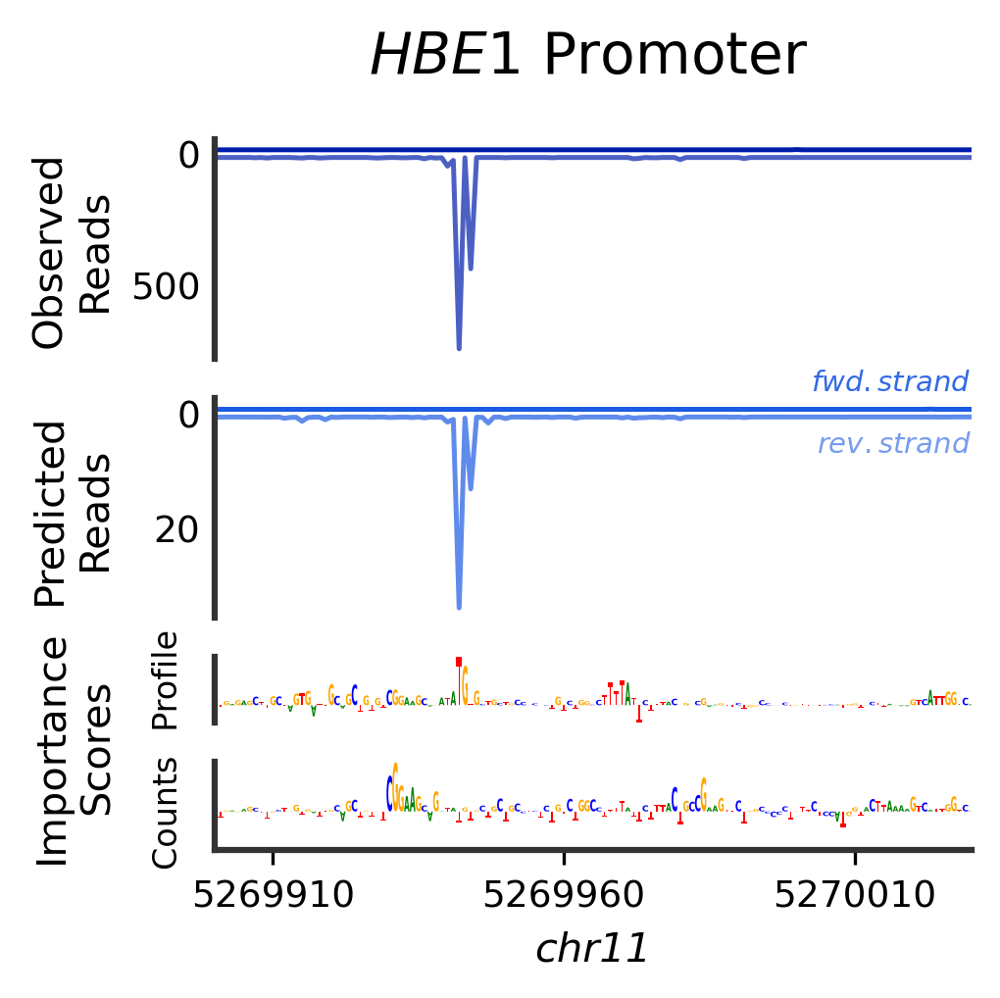

In [103]:
from matplotlib.offsetbox import AnchoredText
from other_motif_utils import plot_motif_on_ax

import logomaker

def plot_motif_on_ax(array, ax, fix_appearance = True):
    assert len(array.shape) == 2 and array.shape[-1] == 4, array.shape
    # reformat pwm to what logomaker expects
    df = pd.DataFrame(array, columns=['A', 'C', 'G', 'T'])
    df.index.name = 'pos'

    # plot motif ("baseline_width=0" removes the y=0 line)
    logo = logomaker.Logo(df, ax=ax, font_name='Arial Rounded', baseline_width=0)
    
    ax.set_ylim(min(df.sum(axis=1).min(), 0), df.sum(axis=1).max())
    
    if fix_appearance:
        # fix appearance to be less terrible
        logo.style_spines(visible=False)
        ax.set_xticks([])
        ax.set_yticks([])
    
    return logo


def plot_example(true_profile, pred_profile, prof_scores, counts_scores,
                 locus_coords, zoom_mid = None, zoom_width = None, in_window = in_window,
                 prof_len = out_window, title = None, linewidth=None, label_strands = True,
                 imp_score_pad = 0.185):
    
    num_subplots = 4
    
    fig, axes = plt.subplots(num_subplots, figsize=(3, 2.7),
                             sharex=True, dpi=300,
                             gridspec_kw = {"height_ratios" : [1,1,0.3,0.4]})
    plt.tight_layout(pad=0)
    
    if title is not None:
        fig.suptitle(title, x=0.53, y = 1.12, fontsize=14, horizontalalignment='center')
    
    axis_fontsize = 10
    prof_linewidth = 1.2
    if linewidth is not None:
        prof_linewidth *= linewidth
    
    x_range = np.arange(0,prof_len)
    offset = np.max(np.abs(true_profile)) * 0.02
    axes[0].plot(x_range, true_profile[0] + offset,
                 alpha=1, c = "#001DAC", linewidth=prof_linewidth)
    axes[0].plot(x_range, -1 * true_profile[1] - offset,
                 alpha=0.7, c = "#001DAC", linewidth=prof_linewidth)
    axes[0].set_ylabel("Observed\nReads",
                       fontsize = axis_fontsize)
    
    offset = np.max(np.abs(pred_profile)) * 0.02
    axes[1].plot(x_range, pred_profile[0] + offset,
                 alpha=1, c = "#1B5AE3", linewidth=prof_linewidth)
    axes[1].plot(x_range, -1 * pred_profile[1] - offset,
                 alpha=0.7, c = "#1B5AE3", linewidth=prof_linewidth)
    axes[1].set_ylabel("Predicted\nReads",
                       fontsize = axis_fontsize)
    
    
    prof_scores = prof_scores[:, (in_window - out_window) // 2 : in_window - (in_window - out_window) // 2]
    counts_scores = counts_scores[:, (in_window - out_window) // 2 : in_window - (in_window - out_window) // 2]
    
    logo = plot_motif_on_ax(prof_scores.T, axes[2], fix_appearance = False)
    logo = plot_motif_on_ax(counts_scores.T, axes[3], fix_appearance = False)
    
    axes[2].set_ylabel("  Profile", fontsize = axis_fontsize - 2)
    axes[3].set_ylabel("Counts ", fontsize = axis_fontsize - 2)
    
    axes[2].annotate("Importance\nScores",
            xy=(0, 0), xycoords='axes fraction',
            xytext=(-imp_score_pad, -0.35), textcoords='axes fraction',
            horizontalalignment='center', verticalalignment='center',
            fontsize=axis_fontsize, rotation=90)
    
    
    # zoom into correct position, set x-axis tick values to actual coordinates
    
    if zoom_mid is not None and zoom_width is not None:
        zoom_lims = (zoom_mid - zoom_width, zoom_mid + zoom_width)
        plt.xlim(zoom_lims)
        
        # this should be 2114
        locus_coords_width = locus_coords[2] - locus_coords[1]
        # a 0 on this plot's axis corresponds to position [xticks_offset] on this chromosome
        xticks_offset = locus_coords[1] + (locus_coords_width - prof_len) // 2
        
        # modify the xticks to reflect actual genomic coordinates
        og_xticks = axes[-1].get_xticks()[1:-1:2]
        xticks = [int(xt + xticks_offset) for xt in og_xticks]
        plt.xticks(og_xticks, xticks)
        
        axes[-1].set_xlabel(locus_coords[0], style="italic")
    else:
        x_axis_buffer = 10
        plt.xlim(- x_axis_buffer, prof_len + x_axis_buffer)
        
        axes[-1].set_xlabel("Genomic Axis", fontsize = axis_fontsize)
    
    
    # aesthetics
    
    for ax in axes:
        for side in ["top", "right"]:
            ax.spines[side].set_visible(False)
            
        ax.spines["left"].set_linewidth(1.5)
        ax.spines["left"].set_color("#333333")
        
    
    # y-axis: profiles yes, scores no
    
    for ax in axes[:2]:
        ax.tick_params("y", length=0, labelsize=9)
        ax.set_yticks(ax.get_yticks(minor=False)[1:-1],
                      np.abs(ax.get_yticks(minor=False)).astype(int)[1:-1])
        
    for ax in axes[2:]:
        ax.set_yticks([])
        
    # only x-axis line for bottom plot
    
    for ax in axes[:-1]:
        ax.spines["bottom"].set_visible(False)
        ax.tick_params("x", length=0)
            
    axes[-1].spines["bottom"].set_linewidth(1.5)
    axes[-1].spines["bottom"].set_color("#333333")
    axes[-1].tick_params("x", labelsize=9)

    # put more space between scoes and x-axis line
    axes[-1].set_ylim(axes[-1].get_ylim()[0] * 2.5, axes[-1].set_ylim()[1])
    
    if label_strands:
        ymin, ymax = axes[1].get_ylim()
        zero_point = - ymin / (ymax - ymin)
        
        axes[1].annotate(r'$fwd. strand$',
            xy=(1.1, 0.1), xycoords='axes fraction',
            xytext=(1, zero_point + 0.2), textcoords='axes fraction',
            horizontalalignment='right', verticalalignment='top',
            fontsize=7, color="#1B5AE3", alpha=0.9)
        axes[1].annotate(r'$rev. strand$',
            xy=(1.1, 0.1), xycoords='axes fraction',
            xytext=(1, zero_point - 0.08), textcoords='axes fraction',
            horizontalalignment='right', verticalalignment='top',
            fontsize=7, color="#1B5AE3", alpha=0.6)
    
    
    fig.align_ylabels(axes[:2])
    plt.show()
    

plot_example(train_val_true_profs[hbe1_promoter_index],
             np.exp(train_val_log_pred_profs[hbe1_promoter_index]) * np.exp(train_val_pred_logcounts[hbe1_promoter_index]),
             prof_scores[hbe1_promoter_index],
             counts_scores[hbe1_promoter_index],
             hbe1_promoter_coords, zoom_mid = 455, zoom_width = 65,
             title=r'$\it{HBE1}$ Promoter')

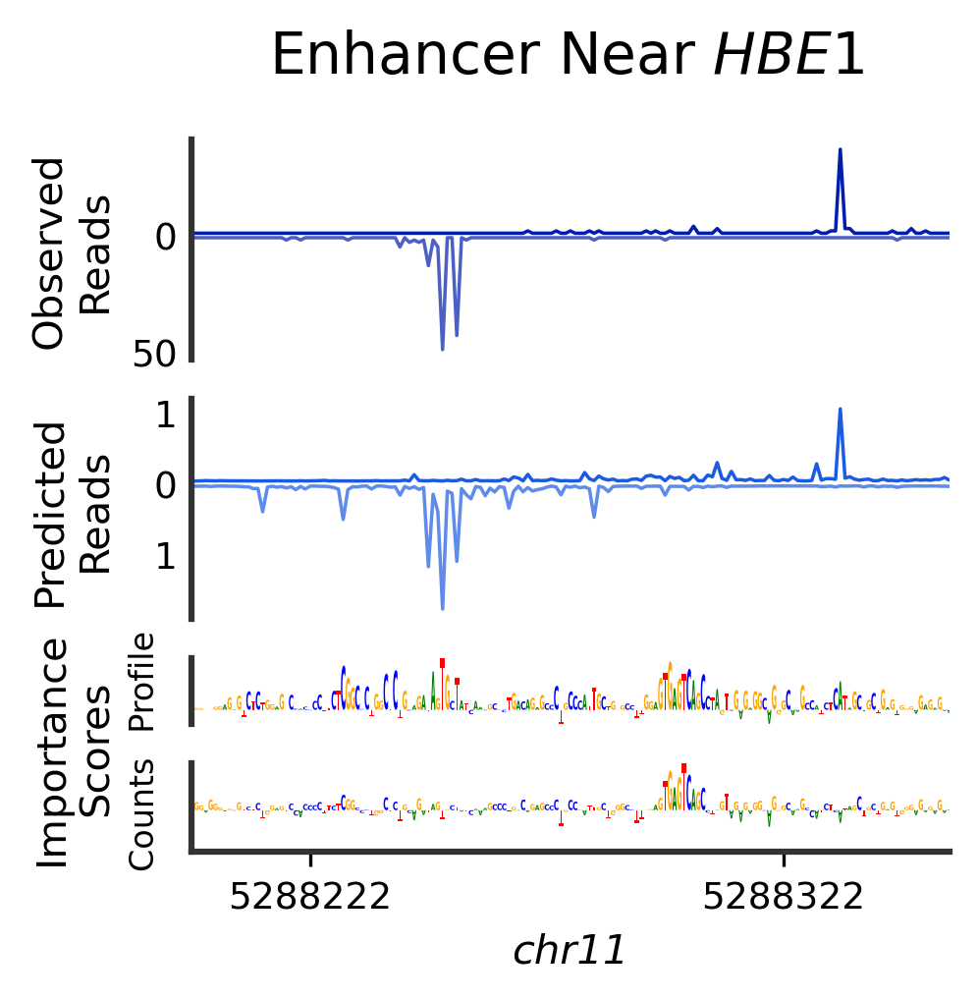

In [104]:
plot_example(train_val_true_profs[hbe1_enhancer_index],
             np.exp(train_val_log_pred_profs[hbe1_enhancer_index]) * np.exp(train_val_pred_logcounts[hbe1_enhancer_index]),
             prof_scores[hbe1_enhancer_index],
             counts_scores[hbe1_enhancer_index],
             hbe1_enhancer_coords,
             zoom_mid = 455, zoom_width = 80,
             title=r'Enhancer Near $\it{HBE1}$', linewidth = 0.7,
             imp_score_pad = 0.155, label_strands = False)